# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
tf.enable_eager_execution()
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

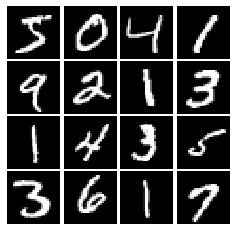

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    leaky_x = tf.maximum(x,alpha*x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return leaky_x


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [33]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    uniform_noise = tf.random_uniform([batch_size, dim], minval=-1, maxval=1)
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return uniform_noise

Make sure noise is the correct shape and type:

In [34]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [45]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(256, input_dim=784),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [46]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [51]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, activation = 'relu', input_dim=noise_dim),
        tf.keras.layers.Dense(1024, activation = 'relu'),
        tf.keras.layers.Dense(784, activation = 'tanh')


        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [52]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [103]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    real_loss=tf.nn.sigmoid_cross_entropy_with_logits(
        labels=tf.ones_like(logits_real),
        logits=logits_real
    )
    
    fake_loss=tf.nn.sigmoid_cross_entropy_with_logits(
        labels=tf.zeros_like(logits_fake),
        logits=logits_fake
    )
    
    loss=tf.reduce_mean(real_loss)+tf.reduce_mean(fake_loss)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    fake_loss=tf.nn.sigmoid_cross_entropy_with_logits(
        labels=tf.ones_like(logits_fake),
        logits=logits_fake
    )
    loss=tf.reduce_mean(fake_loss)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [104]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 0


In [105]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 7.19722e-17


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [106]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5) 
    G_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [107]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.651, G:0.731


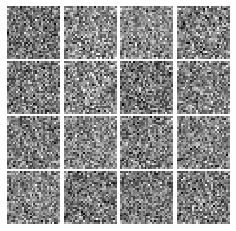

Epoch: 0, Iter: 20, D: 0.5987, G:0.9381


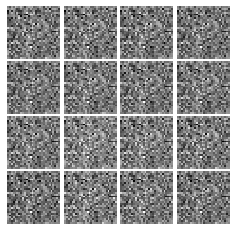

Epoch: 0, Iter: 40, D: 0.8875, G:0.782


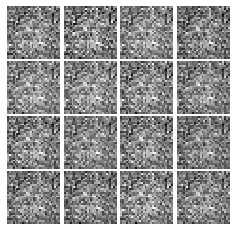

Epoch: 0, Iter: 60, D: 1.244, G:1.642


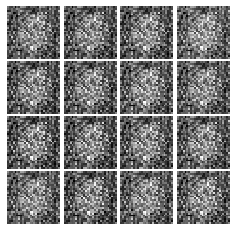

Epoch: 0, Iter: 80, D: 1.076, G:1.359


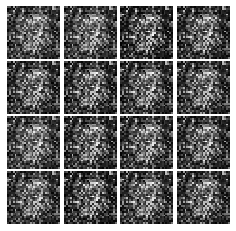

Epoch: 0, Iter: 100, D: 1.292, G:0.8775


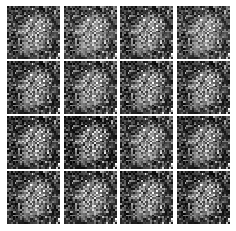

Epoch: 0, Iter: 120, D: 0.9121, G:1.658


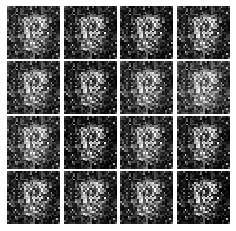

Epoch: 0, Iter: 140, D: 1.155, G:2.192


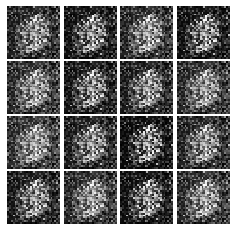

Epoch: 0, Iter: 160, D: 1.794, G:1.222


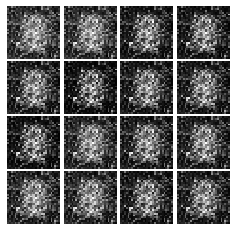

Epoch: 0, Iter: 180, D: 1.456, G:0.9526


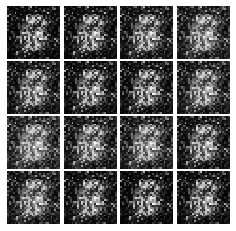

Epoch: 0, Iter: 200, D: 1.149, G:2.023


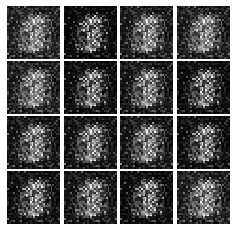

Epoch: 0, Iter: 220, D: 1.217, G:1.337


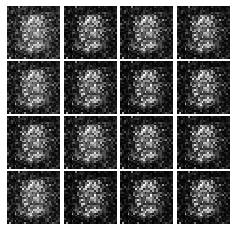

Epoch: 0, Iter: 240, D: 0.9254, G:1.229


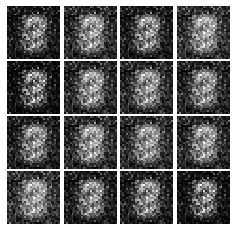

Epoch: 0, Iter: 260, D: 1.227, G:1.712


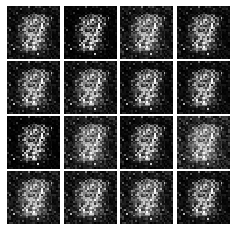

Epoch: 0, Iter: 280, D: 0.7222, G:1.476


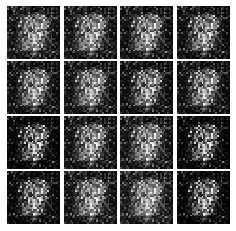

Epoch: 0, Iter: 300, D: 1.011, G:1.821


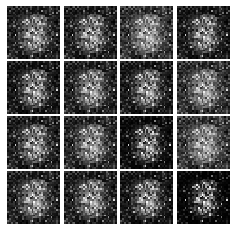

Epoch: 0, Iter: 320, D: 0.8681, G:1.638


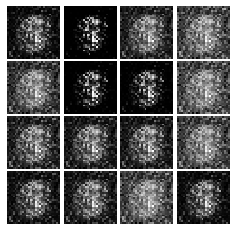

Epoch: 0, Iter: 340, D: 3.354, G:0.5509


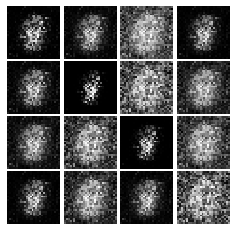

Epoch: 0, Iter: 360, D: 1.888, G:0.9698


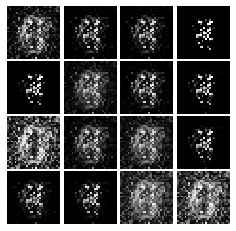

Epoch: 0, Iter: 380, D: 1.145, G:1.049


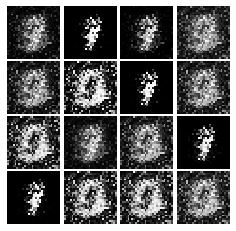

Epoch: 0, Iter: 400, D: 0.7877, G:1.842


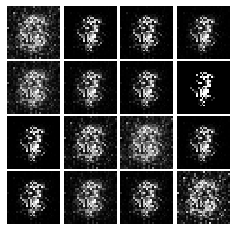

Epoch: 0, Iter: 420, D: 0.6578, G:2.005


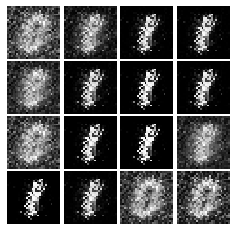

Epoch: 0, Iter: 440, D: 0.9042, G:3.036


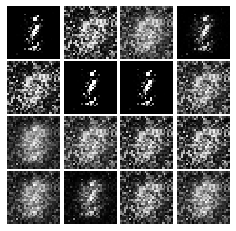

Epoch: 0, Iter: 460, D: 0.5314, G:1.939


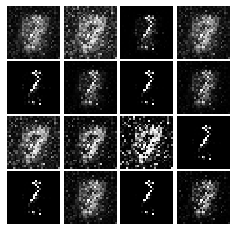

Epoch: 1, Iter: 480, D: 1.133, G:1.27


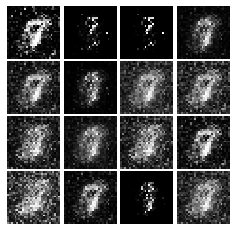

Epoch: 1, Iter: 500, D: 1.144, G:1.816


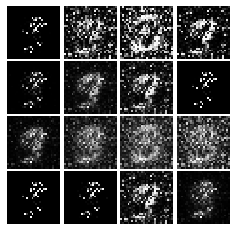

Epoch: 1, Iter: 520, D: 0.8865, G:1.729


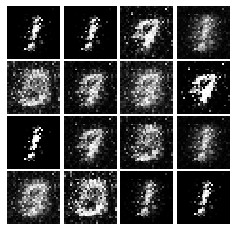

Epoch: 1, Iter: 540, D: 0.8055, G:1.966


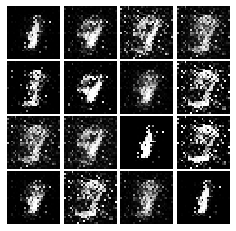

Epoch: 1, Iter: 560, D: 1.129, G:1.747


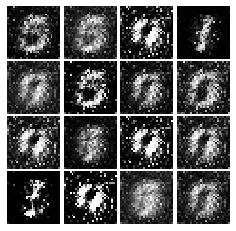

Epoch: 1, Iter: 580, D: 0.9308, G:1.085


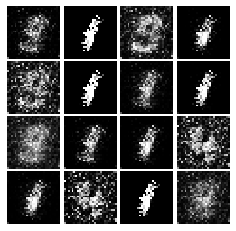

Epoch: 1, Iter: 600, D: 0.7949, G:1.822


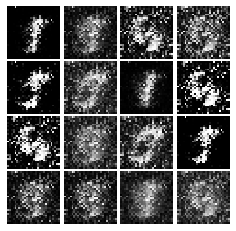

Epoch: 1, Iter: 620, D: 0.868, G:1.553


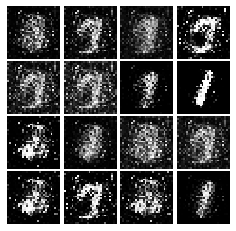

Epoch: 1, Iter: 640, D: 1.03, G:1.625


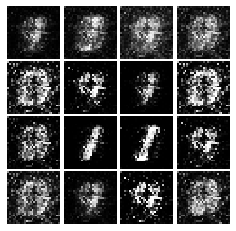

Epoch: 1, Iter: 660, D: 0.9126, G:1.578


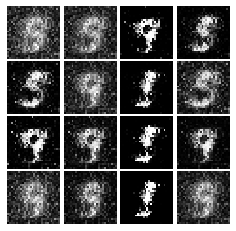

Epoch: 1, Iter: 680, D: 1.322, G:0.9547


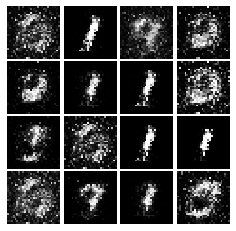

Epoch: 1, Iter: 700, D: 1.141, G:1.492


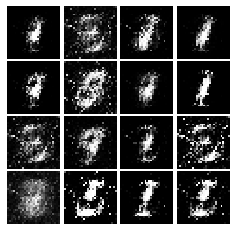

Epoch: 1, Iter: 720, D: 1.246, G:1.08


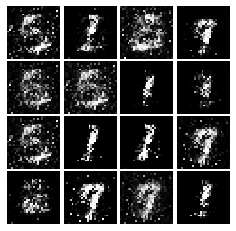

Epoch: 1, Iter: 740, D: 1.506, G:2.213


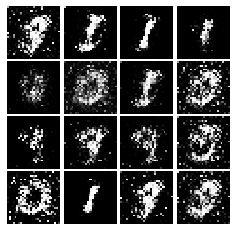

Epoch: 1, Iter: 760, D: 1.054, G:1.468


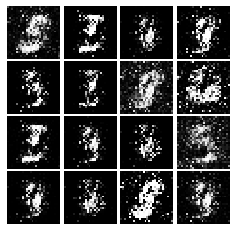

Epoch: 1, Iter: 780, D: 0.9877, G:2.096


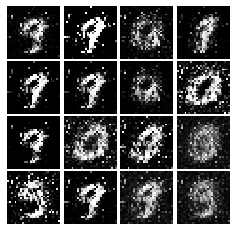

Epoch: 1, Iter: 800, D: 0.8852, G:1.665


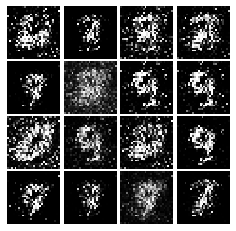

Epoch: 1, Iter: 820, D: 1.139, G:1.012


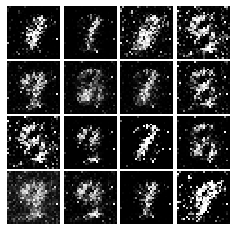

Epoch: 1, Iter: 840, D: 1.109, G:1.365


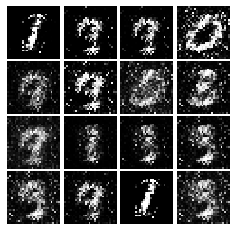

Epoch: 1, Iter: 860, D: 0.9986, G:1.552


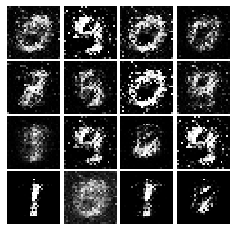

Epoch: 1, Iter: 880, D: 1.02, G:1.304


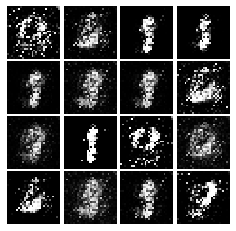

Epoch: 1, Iter: 900, D: 1.046, G:1.12


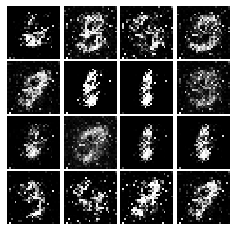

Epoch: 1, Iter: 920, D: 1.621, G:0.8722


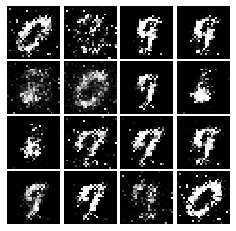

Epoch: 2, Iter: 940, D: 1.245, G:1.057


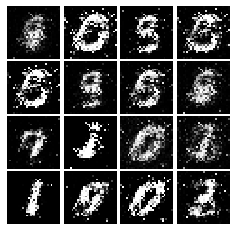

Epoch: 2, Iter: 960, D: 1.07, G:1.248


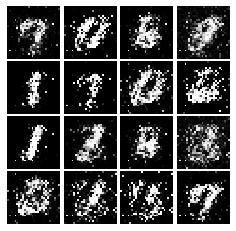

Epoch: 2, Iter: 980, D: 1.075, G:1.313


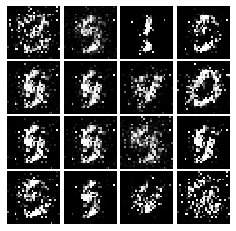

Epoch: 2, Iter: 1000, D: 1.062, G:1.549


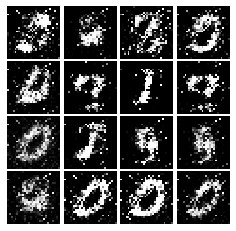

Epoch: 2, Iter: 1020, D: 1.176, G:1.319


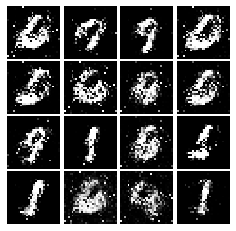

Epoch: 2, Iter: 1040, D: 1.157, G:1.143


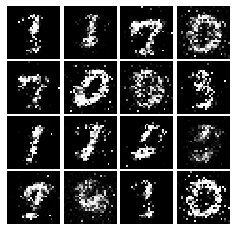

Epoch: 2, Iter: 1060, D: 1.086, G:1.032


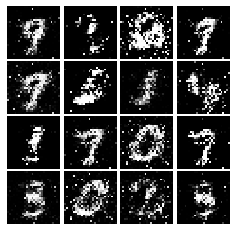

Epoch: 2, Iter: 1080, D: 1.173, G:1.685


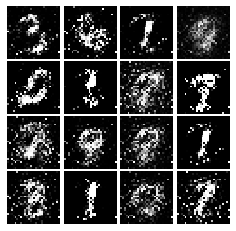

Epoch: 2, Iter: 1100, D: 1.126, G:1.624


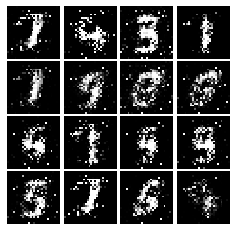

Epoch: 2, Iter: 1120, D: 1.619, G:1.934


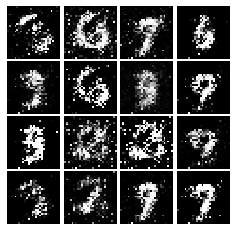

Epoch: 2, Iter: 1140, D: 1.214, G:1.133


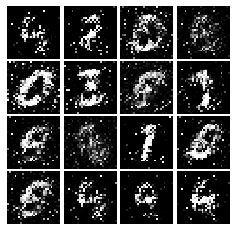

Epoch: 2, Iter: 1160, D: 1.167, G:1.355


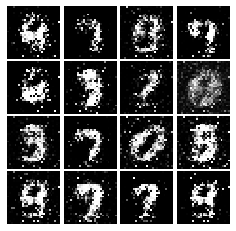

Epoch: 2, Iter: 1180, D: 1.226, G:1.096


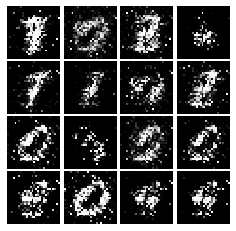

Epoch: 2, Iter: 1200, D: 1.39, G:1.029


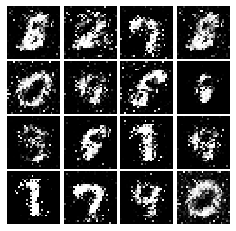

Epoch: 2, Iter: 1220, D: 1.023, G:1.409


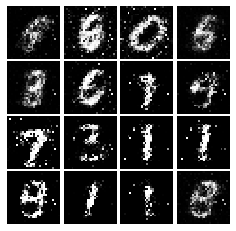

Epoch: 2, Iter: 1240, D: 1.302, G:1.515


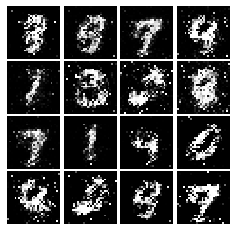

Epoch: 2, Iter: 1260, D: 1.293, G:1.122


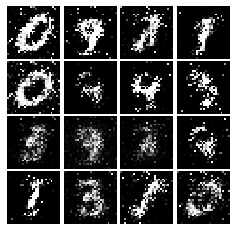

Epoch: 2, Iter: 1280, D: 1.22, G:1.05


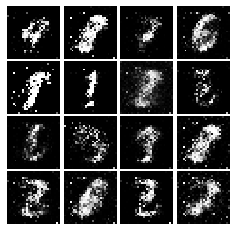

Epoch: 2, Iter: 1300, D: 1.233, G:0.9599


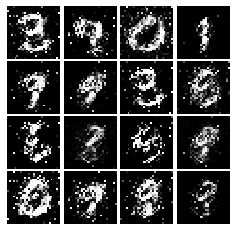

Epoch: 2, Iter: 1320, D: 1.502, G:0.8819


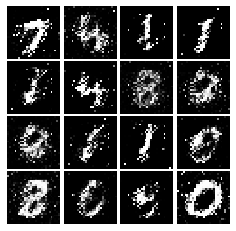

Epoch: 2, Iter: 1340, D: 1.224, G:1.179


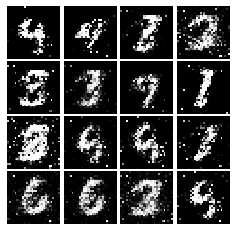

Epoch: 2, Iter: 1360, D: 1.162, G:1.027


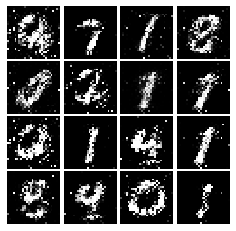

Epoch: 2, Iter: 1380, D: 1.242, G:1.054


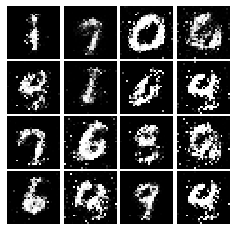

Epoch: 2, Iter: 1400, D: 1.353, G:1.024


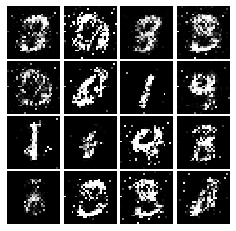

Epoch: 3, Iter: 1420, D: 1.285, G:1.085


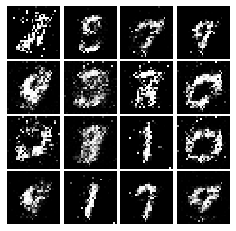

Epoch: 3, Iter: 1440, D: 1.156, G:0.9642


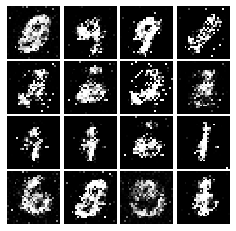

Epoch: 3, Iter: 1460, D: 1.364, G:1.022


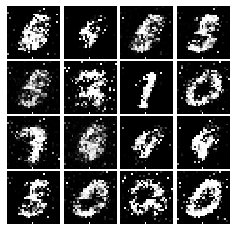

Epoch: 3, Iter: 1480, D: 1.343, G:1.003


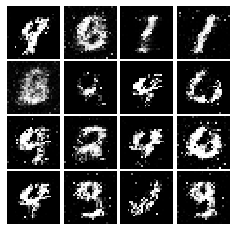

Epoch: 3, Iter: 1500, D: 1.227, G:1.021


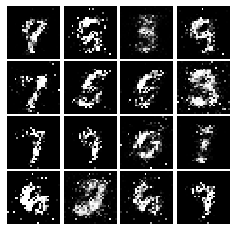

Epoch: 3, Iter: 1520, D: 1.175, G:0.9368


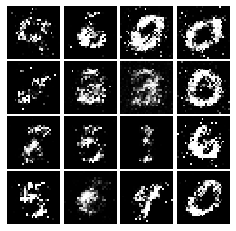

Epoch: 3, Iter: 1540, D: 1.294, G:0.8435


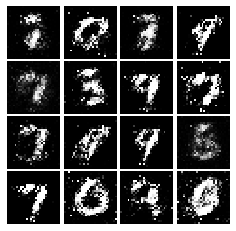

Epoch: 3, Iter: 1560, D: 1.022, G:1.159


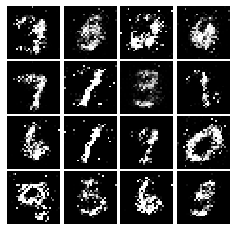

Epoch: 3, Iter: 1580, D: 1.288, G:0.9638


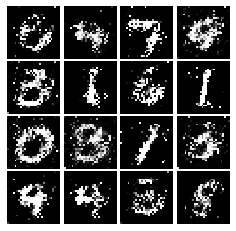

Epoch: 3, Iter: 1600, D: 1.237, G:1.148


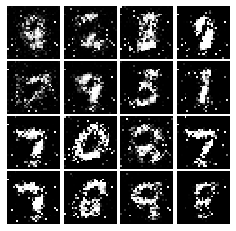

Epoch: 3, Iter: 1620, D: 1.292, G:1.246


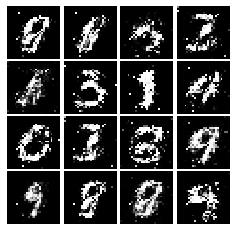

Epoch: 3, Iter: 1640, D: 1.379, G:1.084


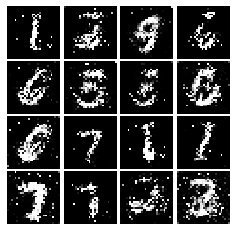

Epoch: 3, Iter: 1660, D: 1.254, G:0.8951


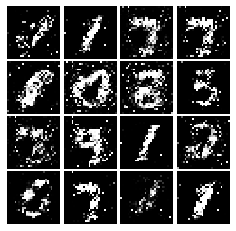

Epoch: 3, Iter: 1680, D: 1.333, G:0.8931


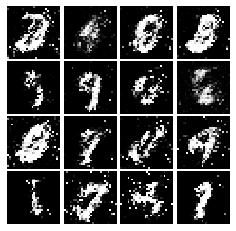

Epoch: 3, Iter: 1700, D: 1.473, G:1.115


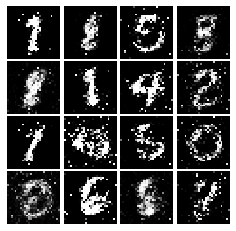

Epoch: 3, Iter: 1720, D: 1.34, G:0.8596


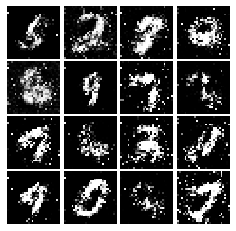

Epoch: 3, Iter: 1740, D: 1.265, G:1.079


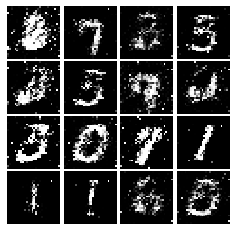

Epoch: 3, Iter: 1760, D: 1.17, G:1.043


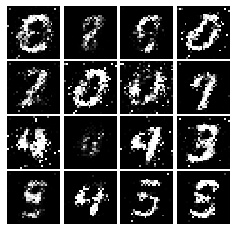

Epoch: 3, Iter: 1780, D: 1.258, G:0.8976


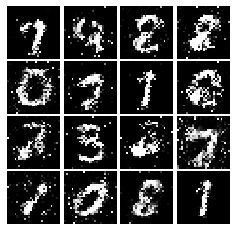

Epoch: 3, Iter: 1800, D: 1.347, G:0.8611


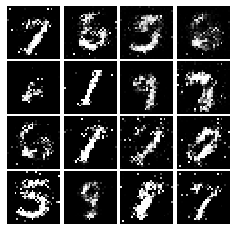

Epoch: 3, Iter: 1820, D: 1.307, G:0.834


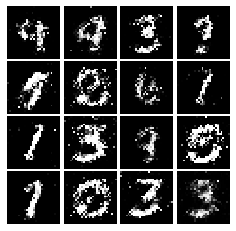

Epoch: 3, Iter: 1840, D: 1.272, G:0.8861


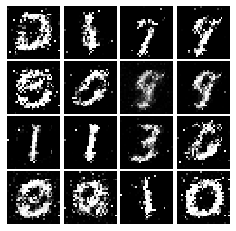

Epoch: 3, Iter: 1860, D: 1.279, G:0.8453


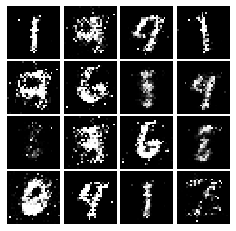

Epoch: 4, Iter: 1880, D: 1.269, G:1.067


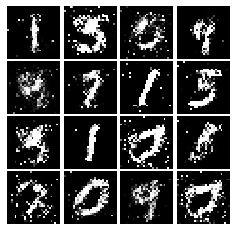

Epoch: 4, Iter: 1900, D: 1.324, G:0.8851


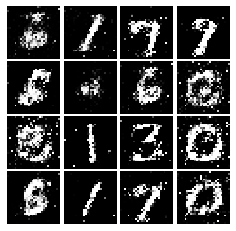

Epoch: 4, Iter: 1920, D: 1.356, G:0.8671


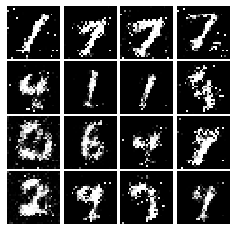

Epoch: 4, Iter: 1940, D: 1.303, G:0.9264


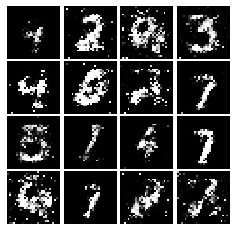

Epoch: 4, Iter: 1960, D: 1.369, G:0.8803


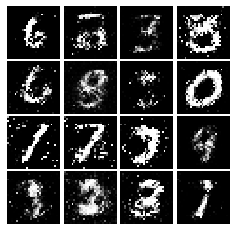

Epoch: 4, Iter: 1980, D: 1.231, G:0.8204


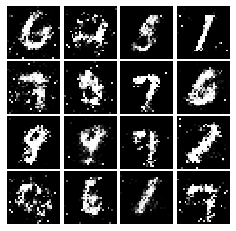

Epoch: 4, Iter: 2000, D: 1.224, G:0.9828


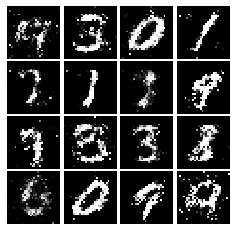

Epoch: 4, Iter: 2020, D: 1.249, G:0.7959


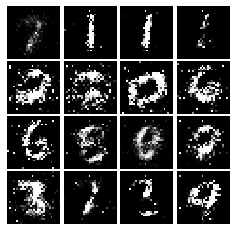

Epoch: 4, Iter: 2040, D: 1.268, G:1.376


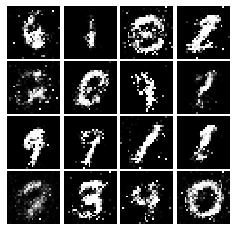

Epoch: 4, Iter: 2060, D: 1.332, G:1.034


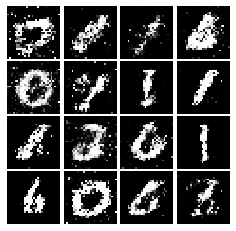

Epoch: 4, Iter: 2080, D: 1.209, G:0.9515


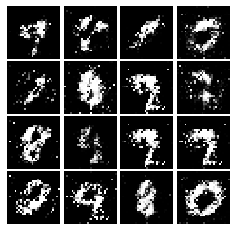

Epoch: 4, Iter: 2100, D: 1.286, G:0.8576


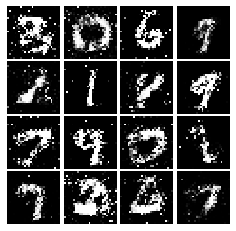

Epoch: 4, Iter: 2120, D: 1.328, G:0.8257


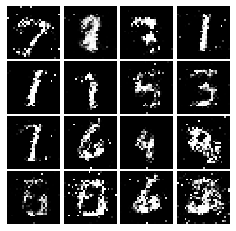

Epoch: 4, Iter: 2140, D: 1.346, G:0.8907


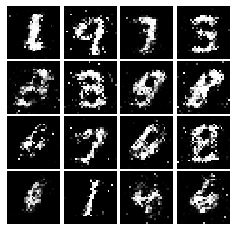

Epoch: 4, Iter: 2160, D: 1.298, G:0.853


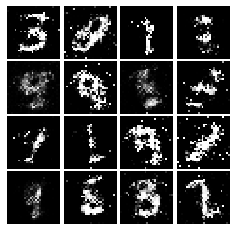

Epoch: 4, Iter: 2180, D: 1.366, G:0.962


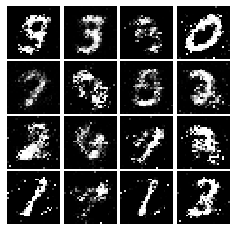

Epoch: 4, Iter: 2200, D: 1.259, G:0.8836


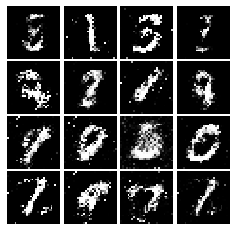

Epoch: 4, Iter: 2220, D: 1.277, G:1.076


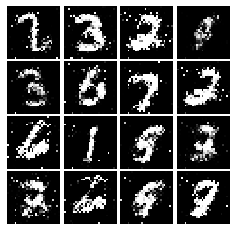

Epoch: 4, Iter: 2240, D: 1.309, G:0.8211


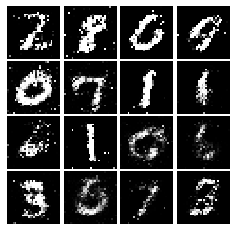

Epoch: 4, Iter: 2260, D: 1.273, G:0.9577


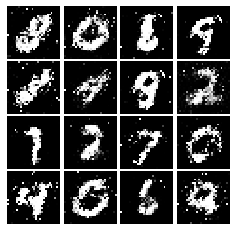

Epoch: 4, Iter: 2280, D: 1.364, G:0.9176


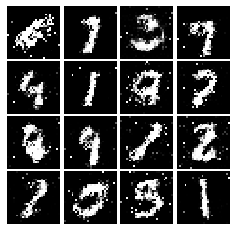

Epoch: 4, Iter: 2300, D: 1.324, G:0.9236


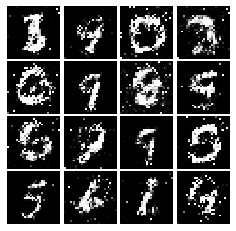

Epoch: 4, Iter: 2320, D: 1.179, G:0.9124


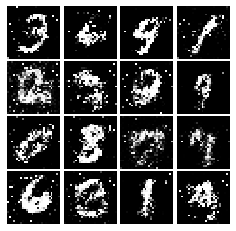

Epoch: 4, Iter: 2340, D: 1.36, G:0.8058


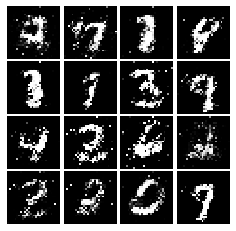

Epoch: 5, Iter: 2360, D: 1.276, G:1.026


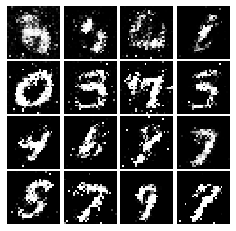

Epoch: 5, Iter: 2380, D: 1.239, G:0.8262


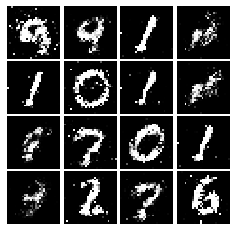

Epoch: 5, Iter: 2400, D: 1.328, G:0.9152


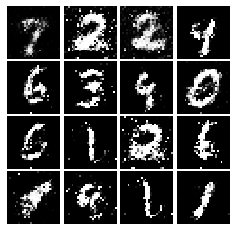

Epoch: 5, Iter: 2420, D: 1.192, G:0.9052


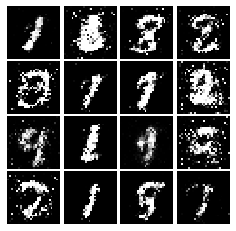

Epoch: 5, Iter: 2440, D: 1.319, G:0.788


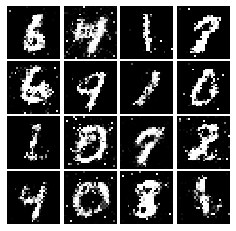

Epoch: 5, Iter: 2460, D: 1.104, G:0.9992


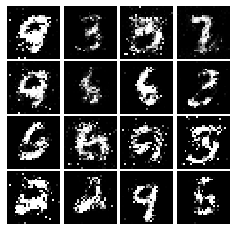

Epoch: 5, Iter: 2480, D: 1.272, G:0.8735


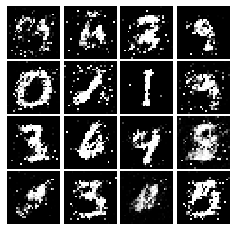

Epoch: 5, Iter: 2500, D: 1.123, G:0.9989


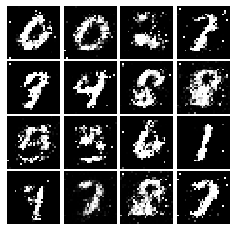

Epoch: 5, Iter: 2520, D: 1.382, G:0.8975


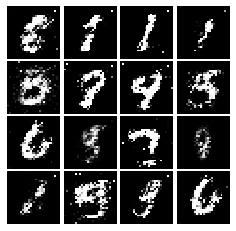

Epoch: 5, Iter: 2540, D: 1.323, G:0.9061


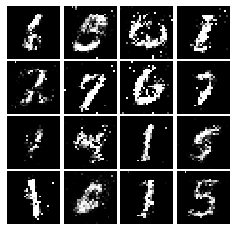

Epoch: 5, Iter: 2560, D: 1.458, G:0.8874


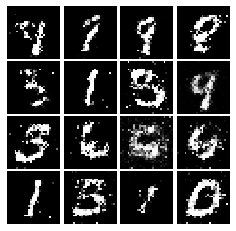

Epoch: 5, Iter: 2580, D: 1.44, G:0.9066


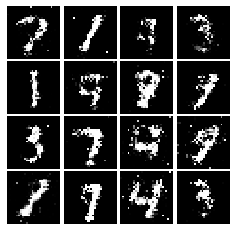

Epoch: 5, Iter: 2600, D: 1.372, G:0.8549


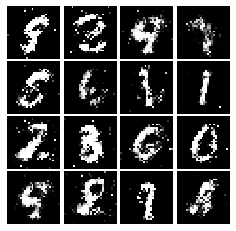

Epoch: 5, Iter: 2620, D: 1.296, G:0.9671


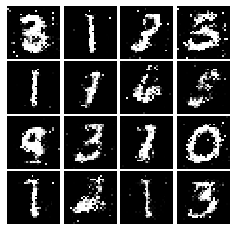

Epoch: 5, Iter: 2640, D: 1.319, G:0.7612


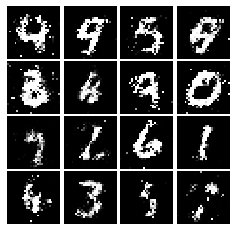

Epoch: 5, Iter: 2660, D: 1.356, G:0.8736


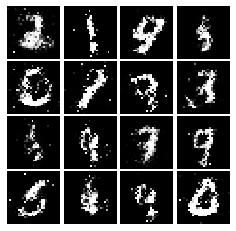

Epoch: 5, Iter: 2680, D: 1.305, G:0.8091


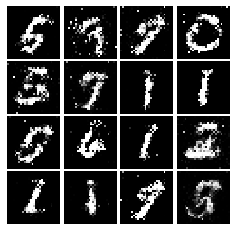

Epoch: 5, Iter: 2700, D: 1.274, G:0.8757


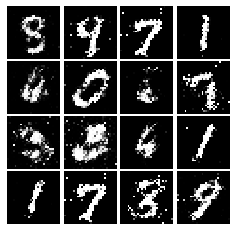

Epoch: 5, Iter: 2720, D: 1.279, G:0.7956


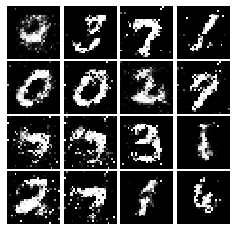

Epoch: 5, Iter: 2740, D: 1.23, G:0.8594


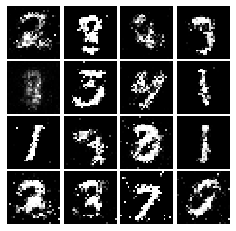

Epoch: 5, Iter: 2760, D: 1.302, G:0.8944


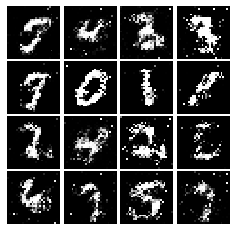

Epoch: 5, Iter: 2780, D: 1.341, G:0.8333


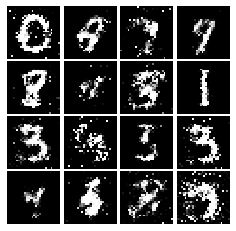

Epoch: 5, Iter: 2800, D: 1.41, G:1.006


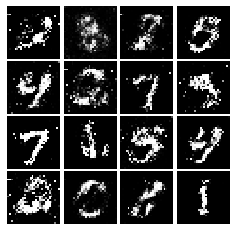

Epoch: 6, Iter: 2820, D: 1.291, G:0.8375


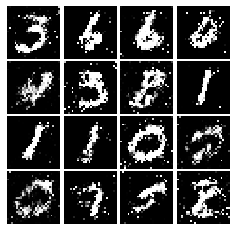

Epoch: 6, Iter: 2840, D: 1.289, G:0.8635


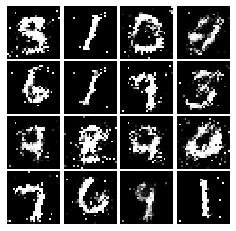

Epoch: 6, Iter: 2860, D: 1.37, G:0.9081


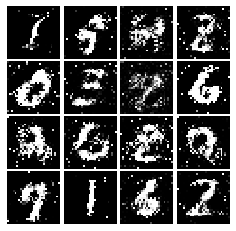

Epoch: 6, Iter: 2880, D: 1.369, G:0.7615


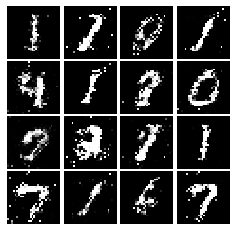

Epoch: 6, Iter: 2900, D: 1.278, G:0.7798


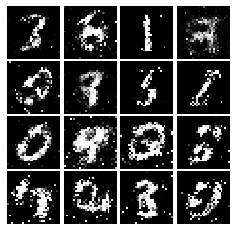

Epoch: 6, Iter: 2920, D: 1.277, G:0.8085


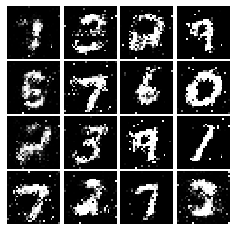

Epoch: 6, Iter: 2940, D: 1.323, G:1.01


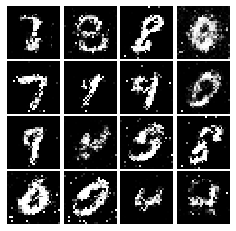

Epoch: 6, Iter: 2960, D: 1.287, G:0.8069


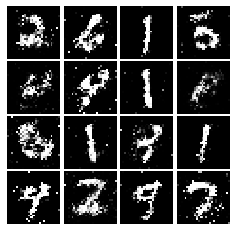

Epoch: 6, Iter: 2980, D: 1.26, G:0.9005


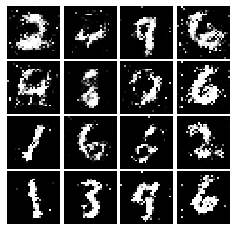

Epoch: 6, Iter: 3000, D: 1.256, G:0.8994


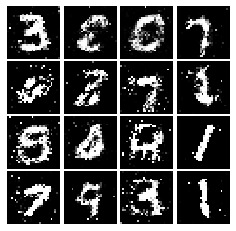

Epoch: 6, Iter: 3020, D: 1.295, G:0.8259


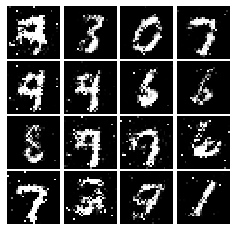

Epoch: 6, Iter: 3040, D: 1.289, G:0.8606


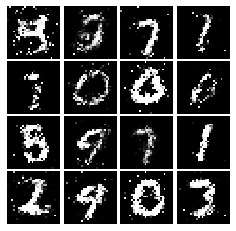

Epoch: 6, Iter: 3060, D: 1.356, G:0.7948


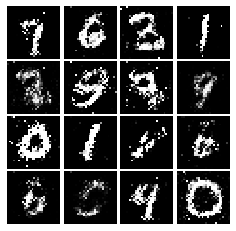

Epoch: 6, Iter: 3080, D: 1.287, G:0.8816


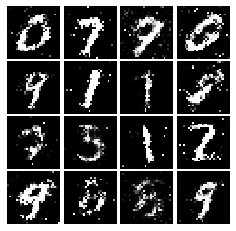

Epoch: 6, Iter: 3100, D: 1.176, G:0.8794


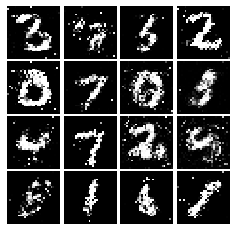

Epoch: 6, Iter: 3120, D: 1.313, G:0.8458


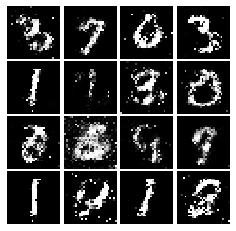

Epoch: 6, Iter: 3140, D: 1.37, G:0.8111


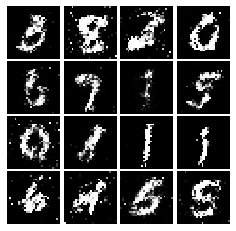

Epoch: 6, Iter: 3160, D: 1.288, G:0.8262


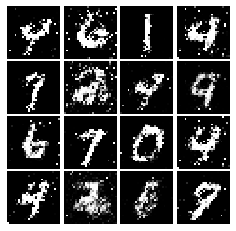

Epoch: 6, Iter: 3180, D: 1.328, G:0.89


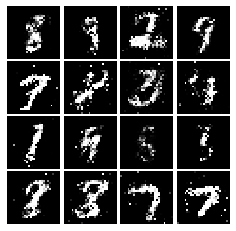

Epoch: 6, Iter: 3200, D: 1.383, G:1.421


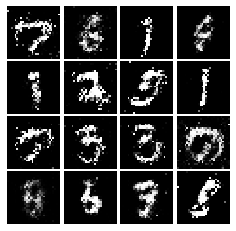

Epoch: 6, Iter: 3220, D: 1.274, G:0.9363


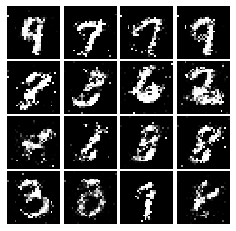

Epoch: 6, Iter: 3240, D: 1.363, G:0.821


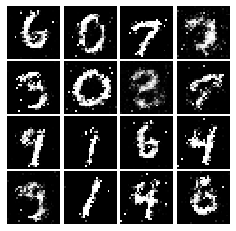

Epoch: 6, Iter: 3260, D: 1.265, G:0.8077


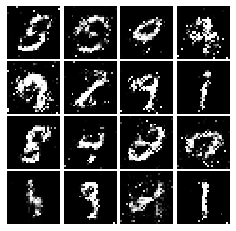

Epoch: 6, Iter: 3280, D: 1.3, G:0.7707


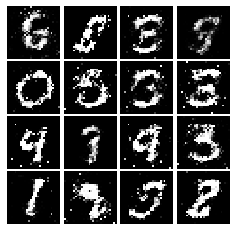

Epoch: 7, Iter: 3300, D: 1.267, G:0.9281


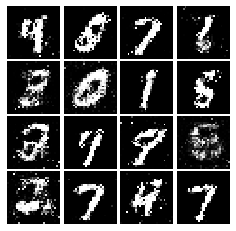

Epoch: 7, Iter: 3320, D: 1.201, G:0.9555


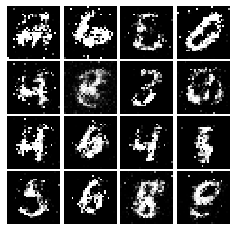

Epoch: 7, Iter: 3340, D: 1.377, G:0.8105


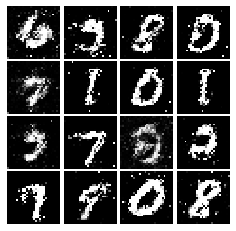

Epoch: 7, Iter: 3360, D: 1.395, G:0.9406


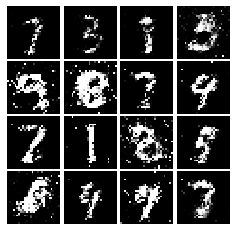

Epoch: 7, Iter: 3380, D: 1.298, G:0.7641


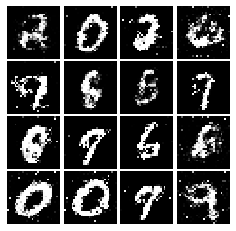

Epoch: 7, Iter: 3400, D: 1.284, G:0.8057


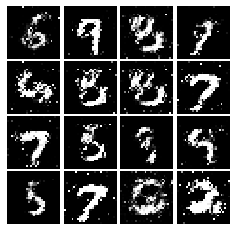

Epoch: 7, Iter: 3420, D: 1.353, G:0.9217


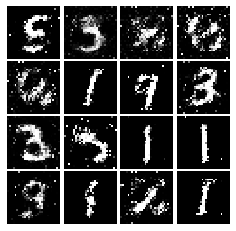

Epoch: 7, Iter: 3440, D: 1.272, G:0.8406


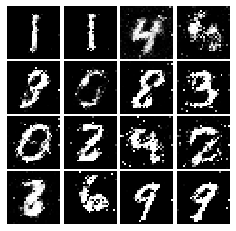

Epoch: 7, Iter: 3460, D: 1.345, G:0.768


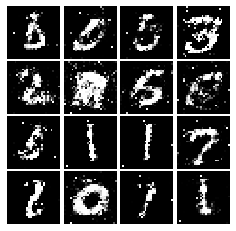

Epoch: 7, Iter: 3480, D: 1.281, G:0.8138


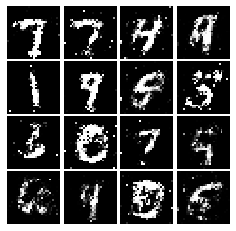

Epoch: 7, Iter: 3500, D: 1.319, G:0.7379


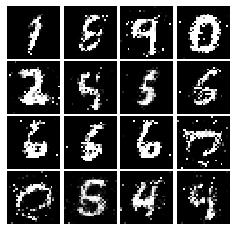

Epoch: 7, Iter: 3520, D: 1.331, G:0.8474


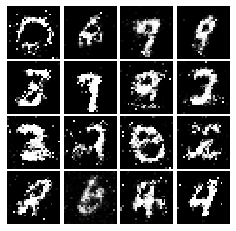

Epoch: 7, Iter: 3540, D: 1.3, G:0.765


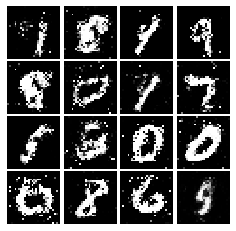

Epoch: 7, Iter: 3560, D: 1.272, G:0.8109


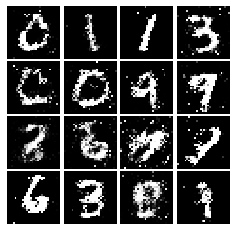

Epoch: 7, Iter: 3580, D: 1.299, G:0.8594


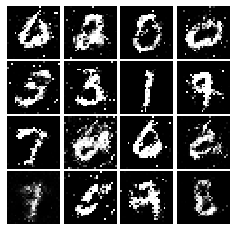

Epoch: 7, Iter: 3600, D: 1.301, G:0.783


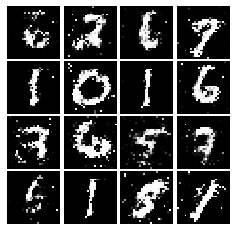

Epoch: 7, Iter: 3620, D: 1.289, G:0.8605


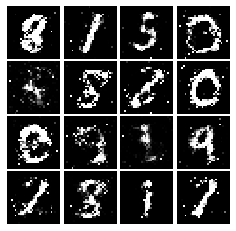

Epoch: 7, Iter: 3640, D: 1.326, G:0.7777


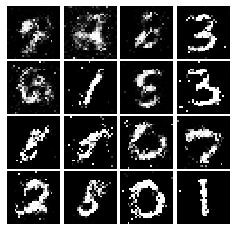

Epoch: 7, Iter: 3660, D: 1.328, G:0.7648


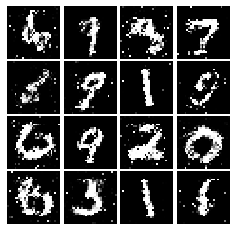

Epoch: 7, Iter: 3680, D: 1.297, G:0.8692


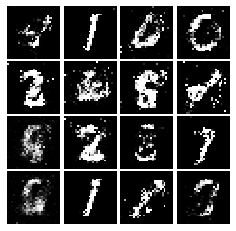

Epoch: 7, Iter: 3700, D: 1.231, G:0.8074


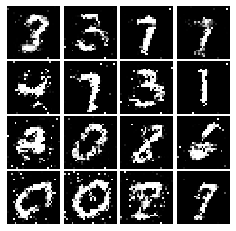

Epoch: 7, Iter: 3720, D: 1.288, G:0.8757


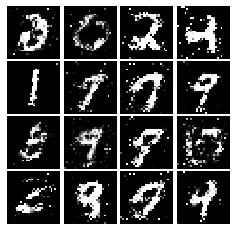

Epoch: 7, Iter: 3740, D: 1.33, G:0.8053


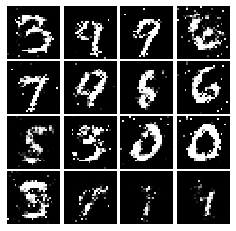

Epoch: 8, Iter: 3760, D: 1.35, G:0.8751


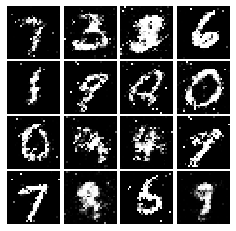

Epoch: 8, Iter: 3780, D: 1.318, G:0.915


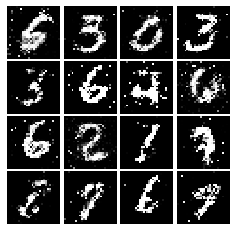

Epoch: 8, Iter: 3800, D: 1.306, G:0.8454


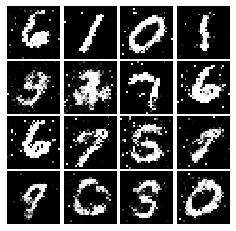

Epoch: 8, Iter: 3820, D: 1.313, G:0.9216


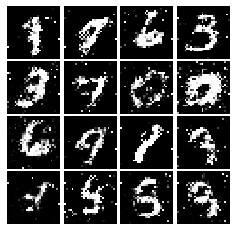

Epoch: 8, Iter: 3840, D: 1.271, G:0.8319


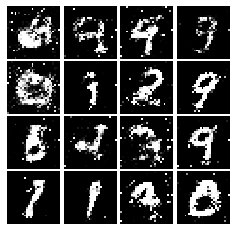

Epoch: 8, Iter: 3860, D: 1.275, G:0.8466


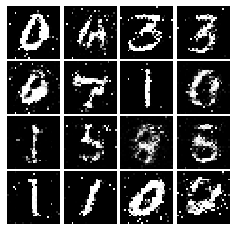

Epoch: 8, Iter: 3880, D: 1.293, G:0.8348


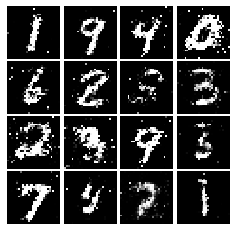

Epoch: 8, Iter: 3900, D: 1.392, G:0.8906


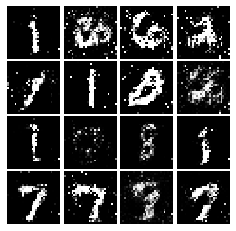

Epoch: 8, Iter: 3920, D: 1.326, G:0.8378


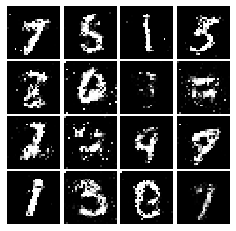

Epoch: 8, Iter: 3940, D: 1.461, G:0.8063


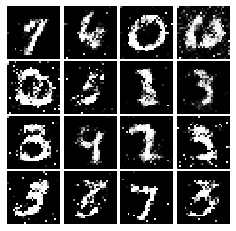

Epoch: 8, Iter: 3960, D: 1.338, G:0.9331


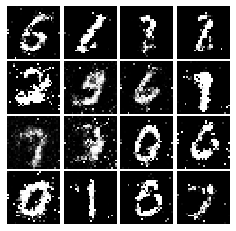

Epoch: 8, Iter: 3980, D: 1.264, G:0.9141


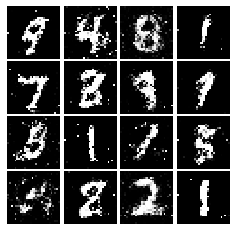

Epoch: 8, Iter: 4000, D: 1.318, G:0.8446


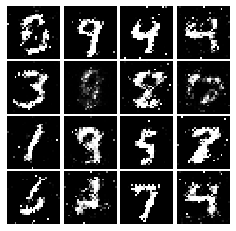

Epoch: 8, Iter: 4020, D: 1.33, G:0.8222


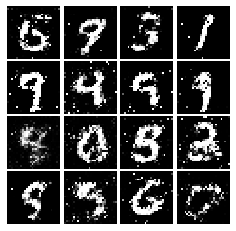

Epoch: 8, Iter: 4040, D: 1.342, G:0.8743


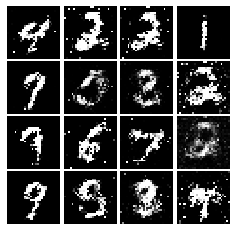

Epoch: 8, Iter: 4060, D: 1.262, G:0.7732


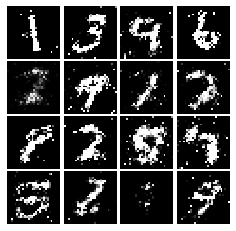

Epoch: 8, Iter: 4080, D: 1.34, G:0.8043


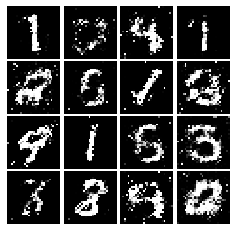

Epoch: 8, Iter: 4100, D: 1.289, G:0.8013


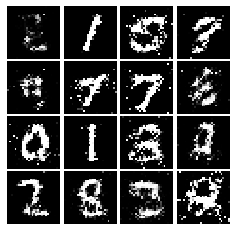

Epoch: 8, Iter: 4120, D: 1.309, G:0.8182


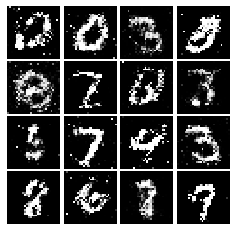

Epoch: 8, Iter: 4140, D: 1.36, G:0.8553


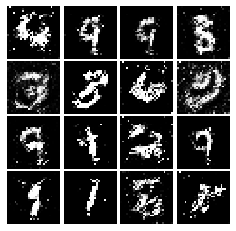

Epoch: 8, Iter: 4160, D: 1.304, G:0.8568


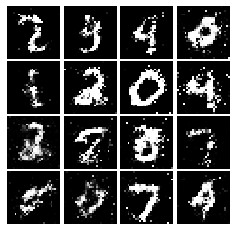

Epoch: 8, Iter: 4180, D: 1.287, G:0.8166


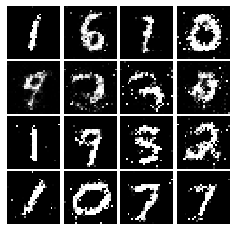

Epoch: 8, Iter: 4200, D: 1.33, G:0.8516


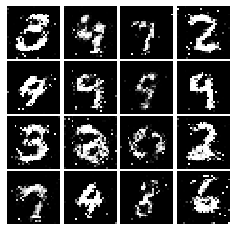

Epoch: 8, Iter: 4220, D: 1.22, G:0.9203


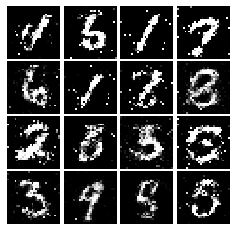

Epoch: 9, Iter: 4240, D: 1.341, G:0.7802


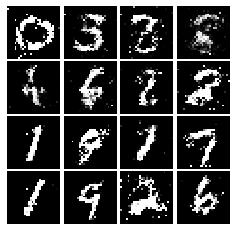

Epoch: 9, Iter: 4260, D: 1.313, G:0.9381


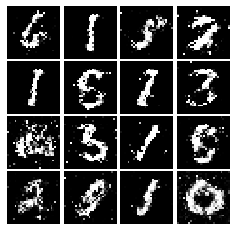

Epoch: 9, Iter: 4280, D: 1.397, G:0.8928


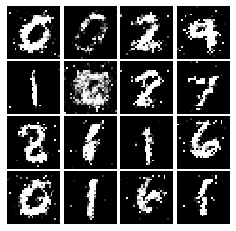

Epoch: 9, Iter: 4300, D: 1.369, G:0.7793


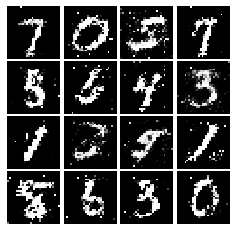

Epoch: 9, Iter: 4320, D: 1.319, G:0.8604


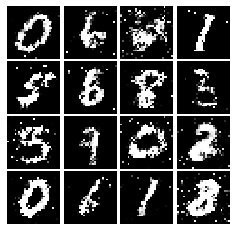

Epoch: 9, Iter: 4340, D: 1.297, G:0.7353


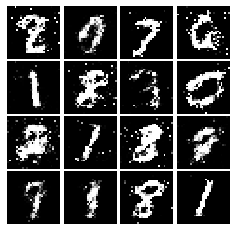

Epoch: 9, Iter: 4360, D: 1.352, G:0.8109


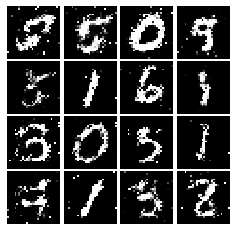

Epoch: 9, Iter: 4380, D: 1.378, G:0.8022


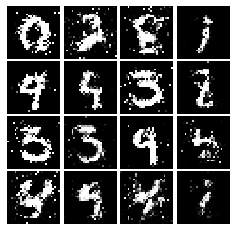

Epoch: 9, Iter: 4400, D: 1.296, G:0.8156


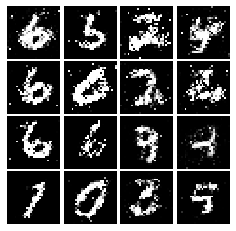

Epoch: 9, Iter: 4420, D: 1.3, G:0.8541


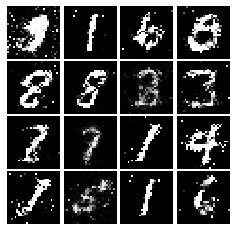

Epoch: 9, Iter: 4440, D: 1.361, G:0.7628


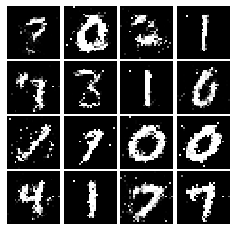

Epoch: 9, Iter: 4460, D: 1.296, G:0.796


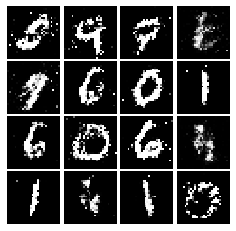

Epoch: 9, Iter: 4480, D: 1.327, G:0.7815


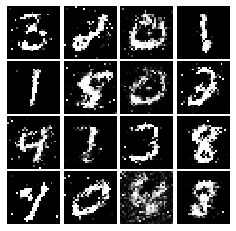

Epoch: 9, Iter: 4500, D: 1.32, G:0.8228


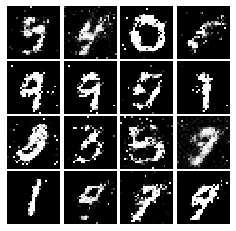

Epoch: 9, Iter: 4520, D: 1.378, G:0.7923


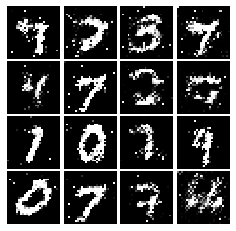

Epoch: 9, Iter: 4540, D: 1.345, G:0.8142


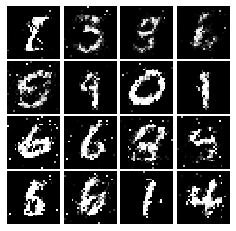

Epoch: 9, Iter: 4560, D: 1.295, G:0.7817


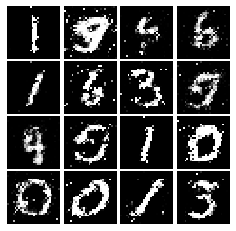

Epoch: 9, Iter: 4580, D: 1.333, G:0.8253


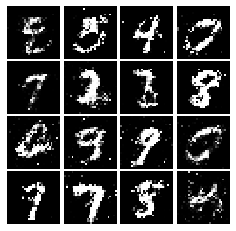

Epoch: 9, Iter: 4600, D: 1.38, G:0.7739


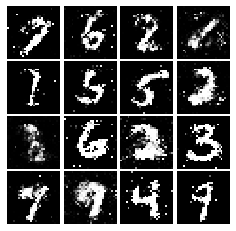

Epoch: 9, Iter: 4620, D: 1.342, G:0.8017


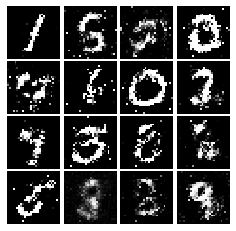

Epoch: 9, Iter: 4640, D: 1.29, G:0.8521


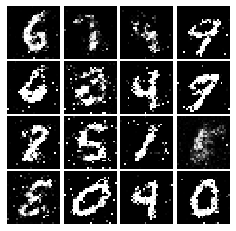

Epoch: 9, Iter: 4660, D: 1.312, G:0.8314


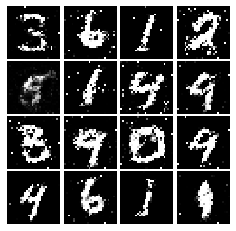

Epoch: 9, Iter: 4680, D: 1.321, G:0.8472


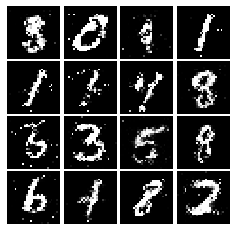

Final images


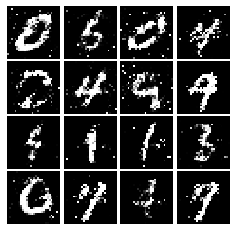

In [88]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [115]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_real_loss=tf.cast(tf.nn.l2_loss(scores_real-1),dtype=tf.float64)/tf.cast(tf.shape(scores_real)[0],dtype=tf.float64)
    D_fake_loss=tf.cast(tf.nn.l2_loss(scores_fake),dtype=tf.float64)/tf.cast(tf.shape(scores_fake)[0],dtype=tf.float64)
    loss=D_real_loss+D_fake_loss


    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss=tf.cast(tf.nn.l2_loss(scores_fake-1),dtype=tf.float64)/tf.cast(tf.shape(scores_fake)[0],dtype=tf.float64)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [116]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.102, G:0.3754


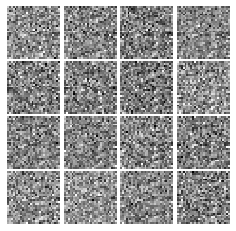

Epoch: 0, Iter: 20, D: 0.04205, G:1.219


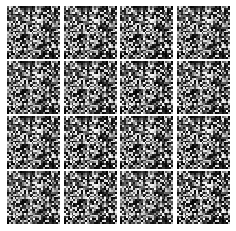

Epoch: 0, Iter: 40, D: 0.01765, G:0.5799


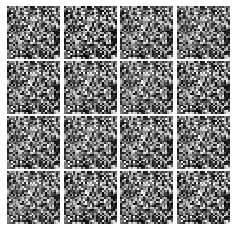

Epoch: 0, Iter: 60, D: 0.02898, G:0.4705


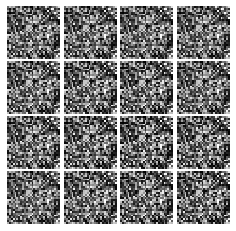

Epoch: 0, Iter: 80, D: 0.01192, G:0.649


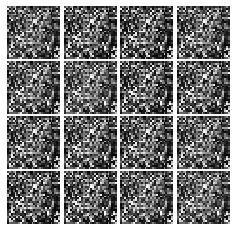

Epoch: 0, Iter: 100, D: 0.0545, G:0.6386


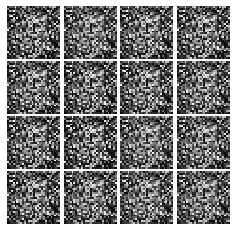

Epoch: 0, Iter: 120, D: 0.02628, G:0.3872


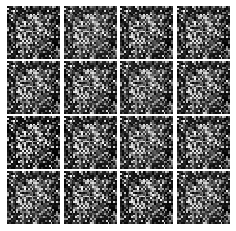

Epoch: 0, Iter: 140, D: 0.3517, G:0.08072


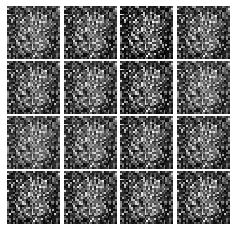

Epoch: 0, Iter: 160, D: 0.4345, G:0.6105


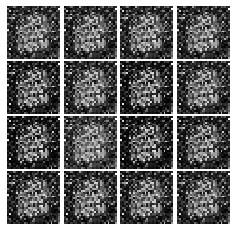

Epoch: 0, Iter: 180, D: 0.06968, G:0.8083


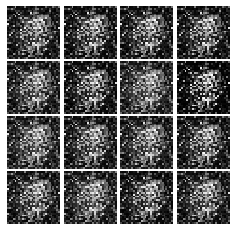

Epoch: 0, Iter: 200, D: 0.2075, G:0.3465


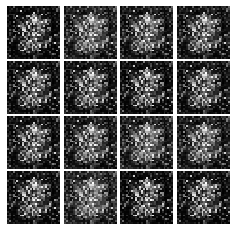

Epoch: 0, Iter: 220, D: 0.6785, G:0.08193


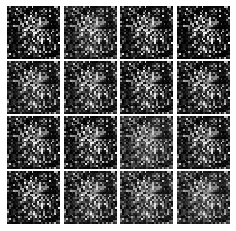

Epoch: 0, Iter: 240, D: 0.1365, G:0.324


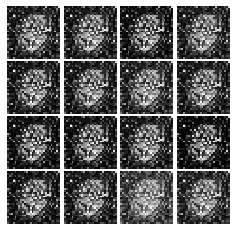

Epoch: 0, Iter: 260, D: 0.1901, G:0.6056


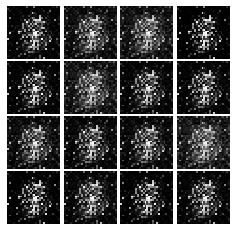

Epoch: 0, Iter: 280, D: 0.1935, G:0.3157


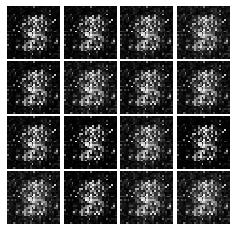

Epoch: 0, Iter: 300, D: 0.2476, G:0.05608


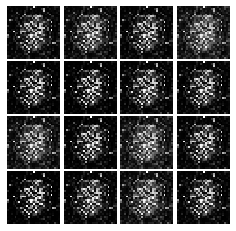

Epoch: 0, Iter: 320, D: 0.1244, G:0.4512


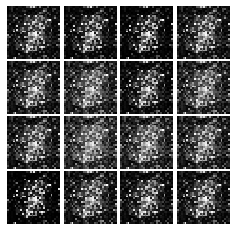

Epoch: 0, Iter: 340, D: 0.2529, G:0.3881


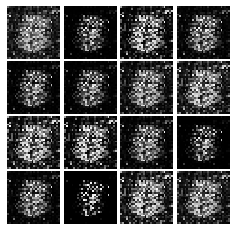

Epoch: 0, Iter: 360, D: 0.08332, G:0.437


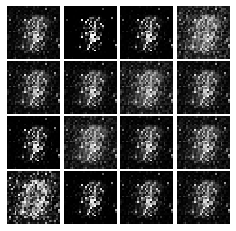

Epoch: 0, Iter: 380, D: 0.1371, G:0.7861


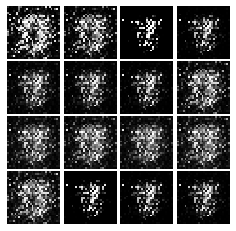

Epoch: 0, Iter: 400, D: 0.1218, G:0.5534


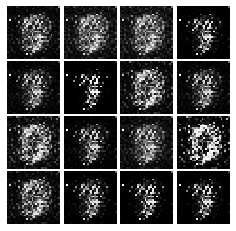

Epoch: 0, Iter: 420, D: 0.1531, G:0.614


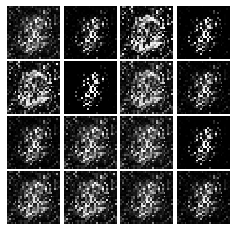

Epoch: 0, Iter: 440, D: 0.124, G:0.6854


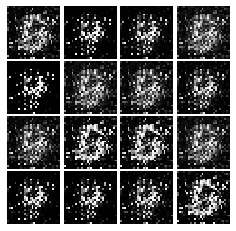

Epoch: 0, Iter: 460, D: 0.6276, G:0.929


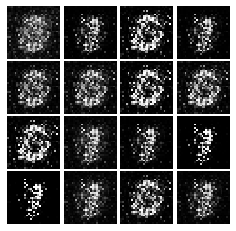

Epoch: 1, Iter: 480, D: 0.1053, G:0.2948


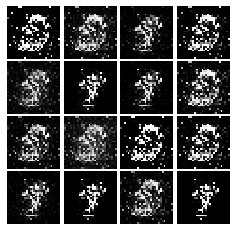

Epoch: 1, Iter: 500, D: 0.09212, G:0.4989


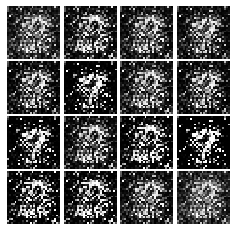

Epoch: 1, Iter: 520, D: 0.09712, G:0.3194


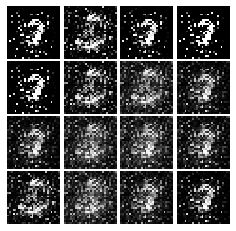

Epoch: 1, Iter: 540, D: 0.08859, G:0.3215


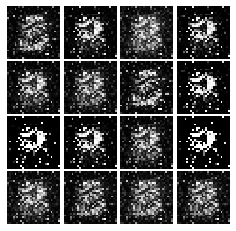

Epoch: 1, Iter: 560, D: 0.1312, G:0.602


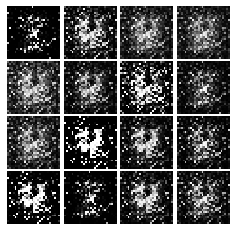

Epoch: 1, Iter: 580, D: 0.1834, G:0.4647


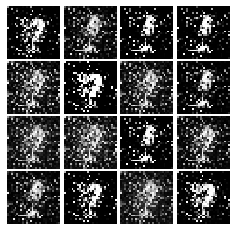

Epoch: 1, Iter: 600, D: 0.2447, G:1.146


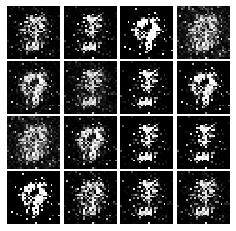

Epoch: 1, Iter: 620, D: 0.1262, G:0.4423


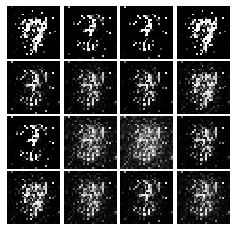

Epoch: 1, Iter: 640, D: 0.1314, G:0.6456


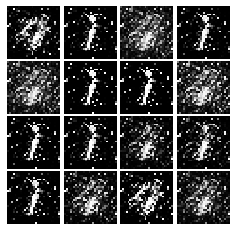

Epoch: 1, Iter: 660, D: 0.2067, G:0.1769


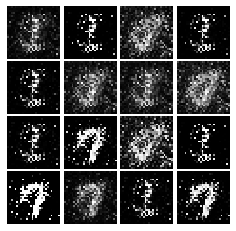

Epoch: 1, Iter: 680, D: 0.1392, G:0.3349


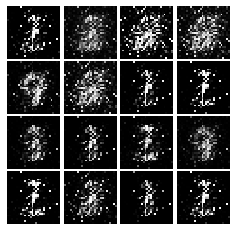

Epoch: 1, Iter: 700, D: 0.1334, G:0.4208


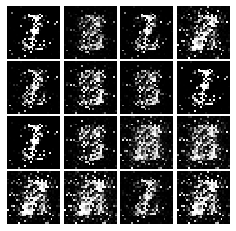

Epoch: 1, Iter: 720, D: 0.1199, G:0.3631


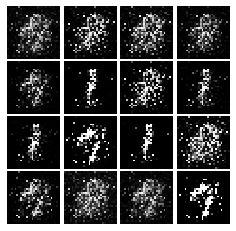

Epoch: 1, Iter: 740, D: 0.1145, G:0.3183


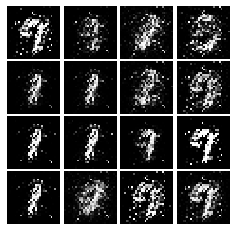

Epoch: 1, Iter: 760, D: 0.1478, G:0.2576


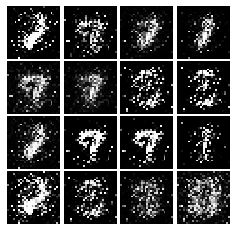

Epoch: 1, Iter: 780, D: 0.7353, G:0.707


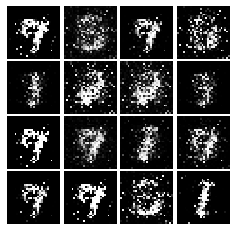

Epoch: 1, Iter: 800, D: 0.151, G:0.4562


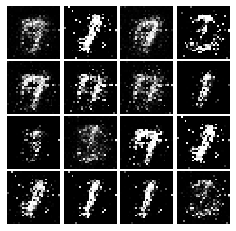

Epoch: 1, Iter: 820, D: 0.06732, G:0.4882


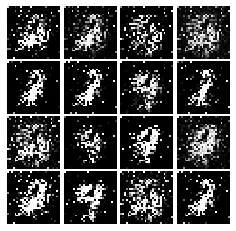

Epoch: 1, Iter: 840, D: 0.2002, G:0.1538


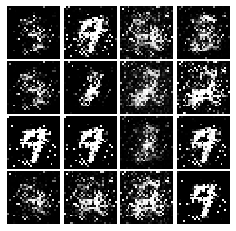

Epoch: 1, Iter: 860, D: 0.1277, G:0.2509


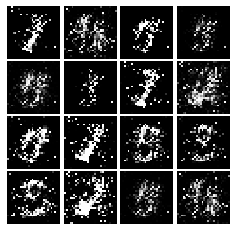

Epoch: 1, Iter: 880, D: 0.2037, G:0.1019


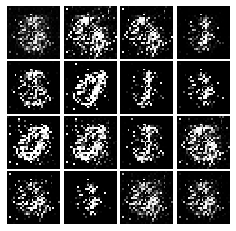

Epoch: 1, Iter: 900, D: 0.1096, G:0.3609


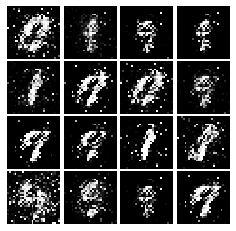

Epoch: 1, Iter: 920, D: 0.1469, G:0.2705


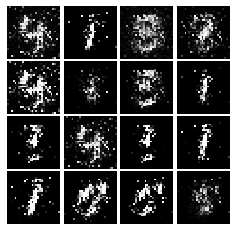

Epoch: 2, Iter: 940, D: 0.2577, G:0.4283


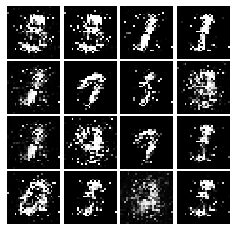

Epoch: 2, Iter: 960, D: 0.1287, G:0.3769


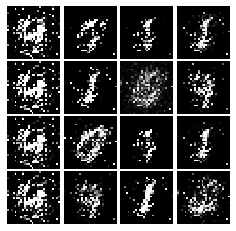

Epoch: 2, Iter: 980, D: 0.1191, G:0.3094


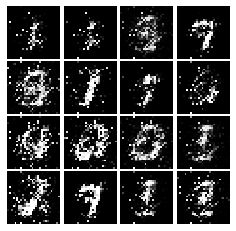

Epoch: 2, Iter: 1000, D: 0.1335, G:0.32


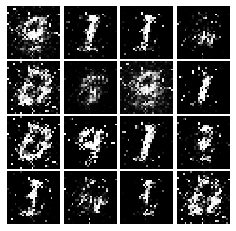

Epoch: 2, Iter: 1020, D: 0.143, G:0.2613


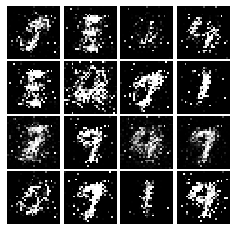

Epoch: 2, Iter: 1040, D: 0.1447, G:0.3422


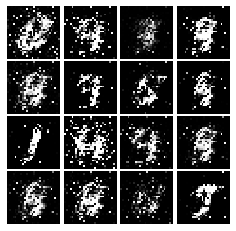

Epoch: 2, Iter: 1060, D: 0.2645, G:0.2524


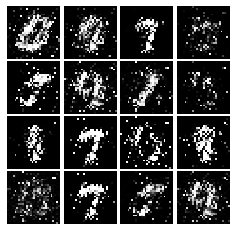

Epoch: 2, Iter: 1080, D: 0.1401, G:0.3047


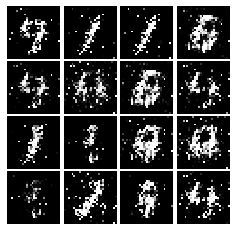

Epoch: 2, Iter: 1100, D: 0.1348, G:0.3927


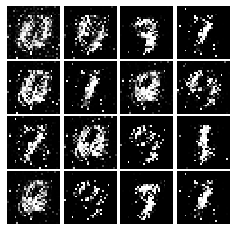

Epoch: 2, Iter: 1120, D: 0.1431, G:0.472


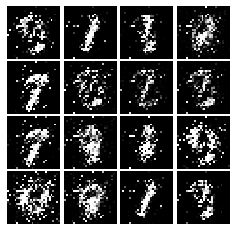

Epoch: 2, Iter: 1140, D: 0.1615, G:0.09555


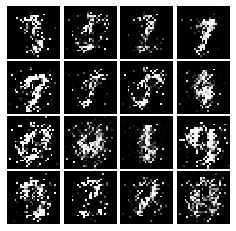

Epoch: 2, Iter: 1160, D: 0.2795, G:0.2144


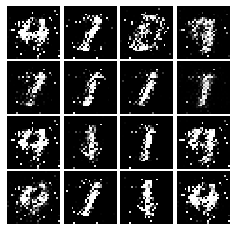

Epoch: 2, Iter: 1180, D: 0.1583, G:0.2482


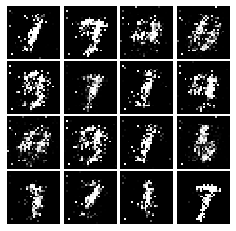

Epoch: 2, Iter: 1200, D: 0.1183, G:0.3393


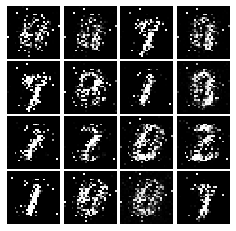

Epoch: 2, Iter: 1220, D: 0.1396, G:0.498


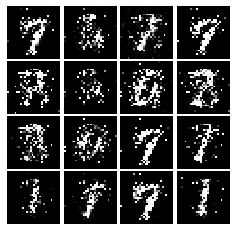

Epoch: 2, Iter: 1240, D: 0.1368, G:0.2903


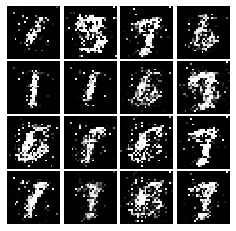

Epoch: 2, Iter: 1260, D: 0.1584, G:0.2834


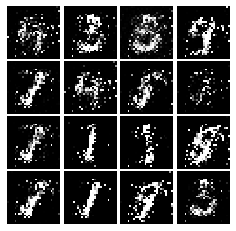

Epoch: 2, Iter: 1280, D: 0.1538, G:0.2378


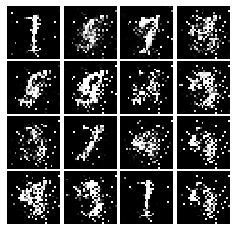

Epoch: 2, Iter: 1300, D: 0.1085, G:0.3288


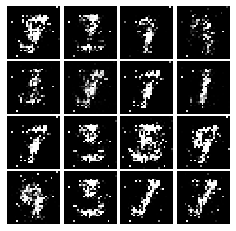

Epoch: 2, Iter: 1320, D: 0.1881, G:0.2806


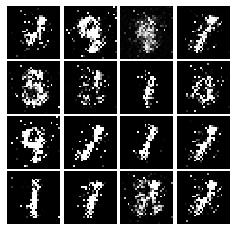

Epoch: 2, Iter: 1340, D: 0.1331, G:0.3004


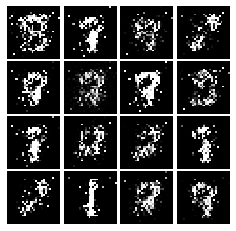

Epoch: 2, Iter: 1360, D: 0.1872, G:0.2499


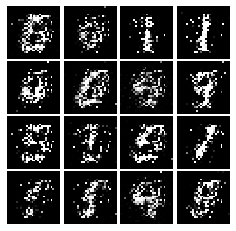

Epoch: 2, Iter: 1380, D: 0.1258, G:0.3905


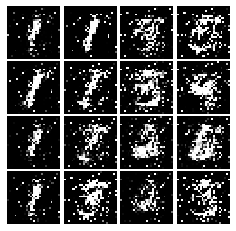

Epoch: 2, Iter: 1400, D: 0.1023, G:0.3355


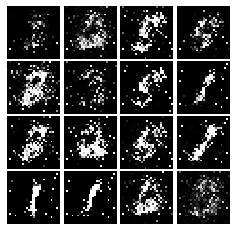

Epoch: 3, Iter: 1420, D: 0.1627, G:0.261


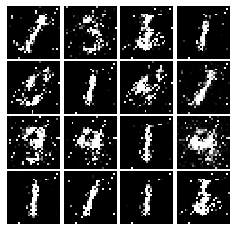

Epoch: 3, Iter: 1440, D: 0.1372, G:0.2667


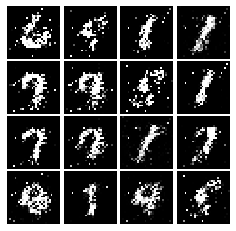

Epoch: 3, Iter: 1460, D: 0.1749, G:0.2514


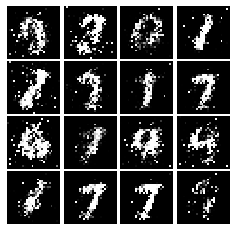

Epoch: 3, Iter: 1480, D: 0.1541, G:0.3418


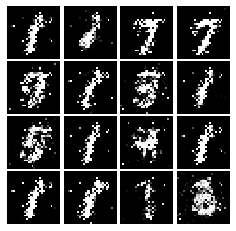

Epoch: 3, Iter: 1500, D: 0.1667, G:0.197


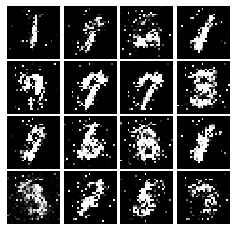

Epoch: 3, Iter: 1520, D: 0.1896, G:0.2539


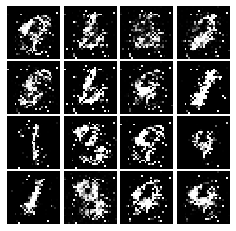

Epoch: 3, Iter: 1540, D: 0.2381, G:0.1614


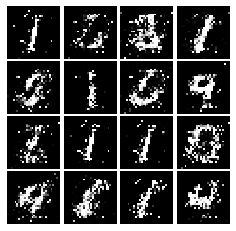

Epoch: 3, Iter: 1560, D: 0.1619, G:0.2879


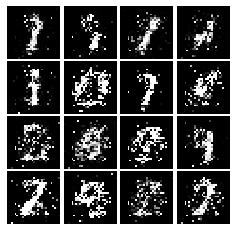

Epoch: 3, Iter: 1580, D: 0.1769, G:0.2631


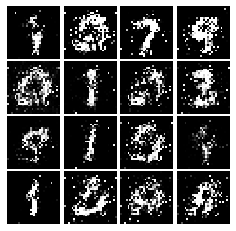

Epoch: 3, Iter: 1600, D: 0.1758, G:0.3672


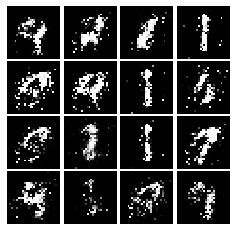

Epoch: 3, Iter: 1620, D: 0.1376, G:0.2761


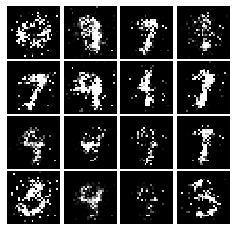

Epoch: 3, Iter: 1640, D: 0.1665, G:0.2742


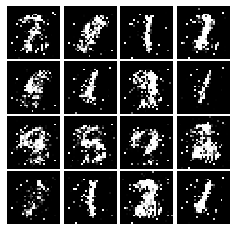

Epoch: 3, Iter: 1660, D: 0.1576, G:0.2721


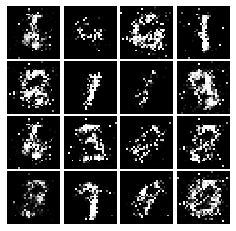

Epoch: 3, Iter: 1680, D: 0.1673, G:0.2503


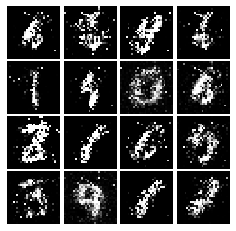

Epoch: 3, Iter: 1700, D: 0.2175, G:0.2896


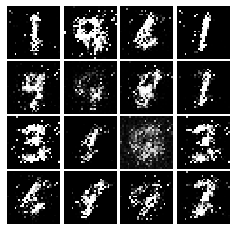

Epoch: 3, Iter: 1720, D: 0.1936, G:0.2344


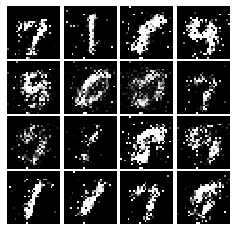

Epoch: 3, Iter: 1740, D: 0.2047, G:0.1383


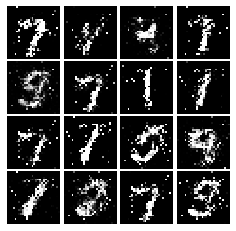

Epoch: 3, Iter: 1760, D: 0.1752, G:0.2634


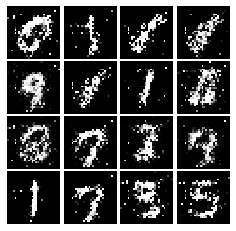

Epoch: 3, Iter: 1780, D: 0.1859, G:0.286


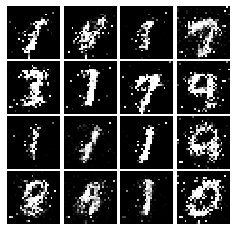

Epoch: 3, Iter: 1800, D: 0.2106, G:0.2144


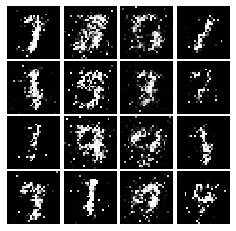

Epoch: 3, Iter: 1820, D: 0.1966, G:0.2334


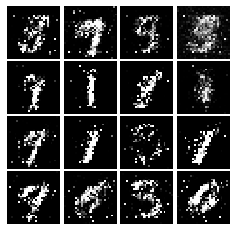

Epoch: 3, Iter: 1840, D: 0.1853, G:0.2368


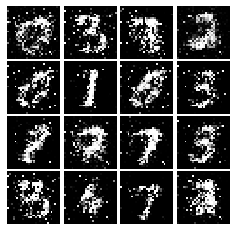

Epoch: 3, Iter: 1860, D: 0.1852, G:0.3091


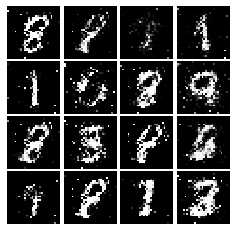

Epoch: 4, Iter: 1880, D: 0.1959, G:0.1914


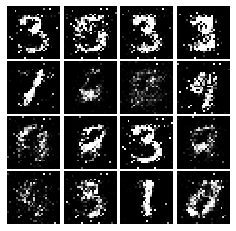

Epoch: 4, Iter: 1900, D: 0.204, G:0.1957


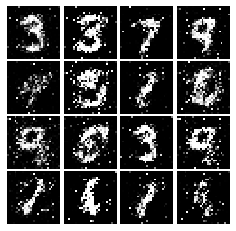

Epoch: 4, Iter: 1920, D: 0.1971, G:0.1892


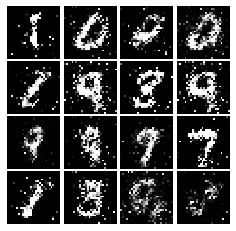

Epoch: 4, Iter: 1940, D: 0.2275, G:0.2815


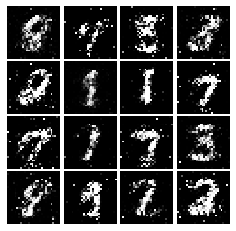

Epoch: 4, Iter: 1960, D: 0.1888, G:0.2196


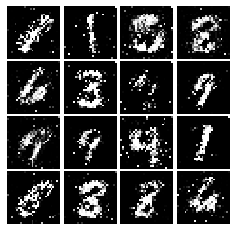

Epoch: 4, Iter: 1980, D: 0.2135, G:0.2125


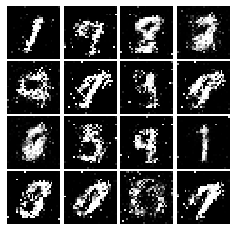

Epoch: 4, Iter: 2000, D: 0.2281, G:0.1548


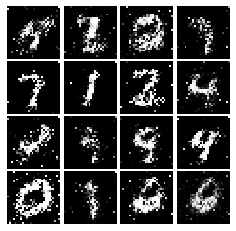

Epoch: 4, Iter: 2020, D: 0.2033, G:0.1928


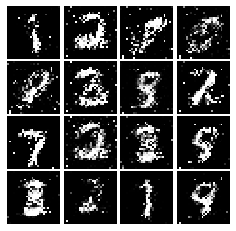

Epoch: 4, Iter: 2040, D: 0.2021, G:0.1969


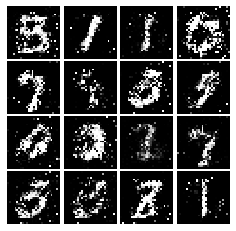

Epoch: 4, Iter: 2060, D: 0.2316, G:0.1758


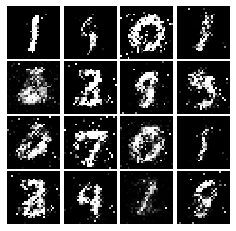

Epoch: 4, Iter: 2080, D: 0.2096, G:0.1863


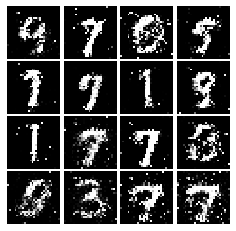

Epoch: 4, Iter: 2100, D: 0.218, G:0.1775


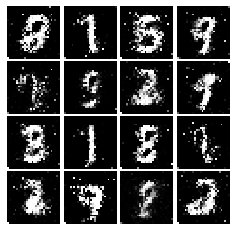

Epoch: 4, Iter: 2120, D: 0.2412, G:0.1867


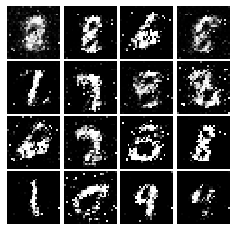

Epoch: 4, Iter: 2140, D: 0.2208, G:0.2101


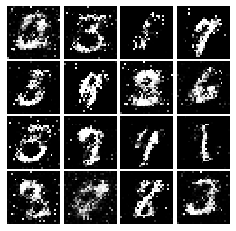

Epoch: 4, Iter: 2160, D: 0.2396, G:0.1737


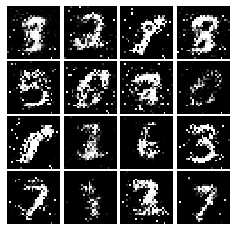

Epoch: 4, Iter: 2180, D: 0.2268, G:0.1856


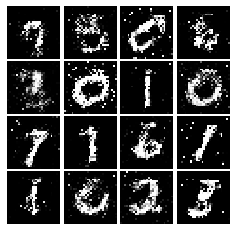

Epoch: 4, Iter: 2200, D: 0.1927, G:0.1928


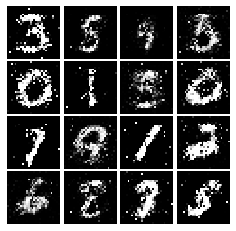

Epoch: 4, Iter: 2220, D: 0.2043, G:0.1985


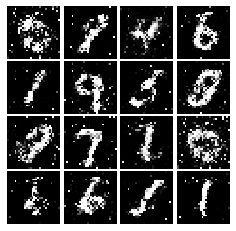

Epoch: 4, Iter: 2240, D: 0.1895, G:0.2306


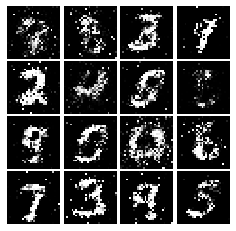

Epoch: 4, Iter: 2260, D: 0.249, G:0.2143


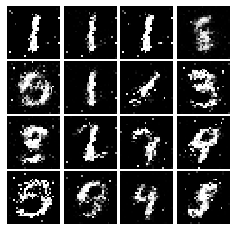

Epoch: 4, Iter: 2280, D: 0.2047, G:0.1926


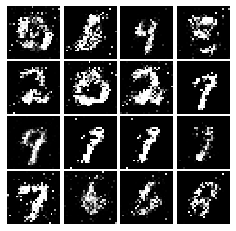

Epoch: 4, Iter: 2300, D: 0.2103, G:0.1695


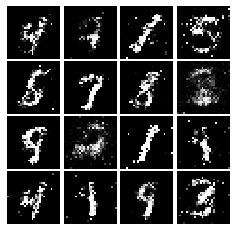

Epoch: 4, Iter: 2320, D: 0.1963, G:0.208


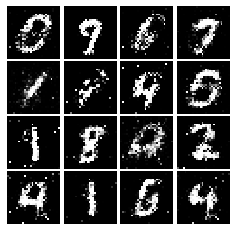

Epoch: 4, Iter: 2340, D: 0.2592, G:0.1767


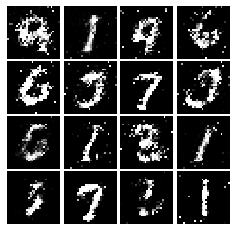

Epoch: 5, Iter: 2360, D: 0.2197, G:0.2064


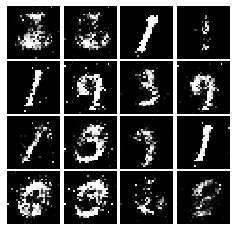

Epoch: 5, Iter: 2380, D: 0.193, G:0.2332


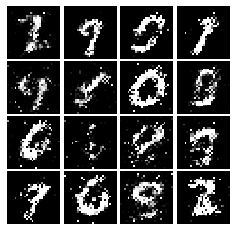

Epoch: 5, Iter: 2400, D: 0.1823, G:0.2266


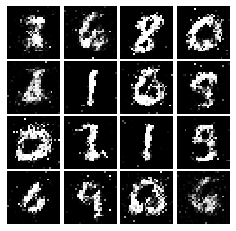

Epoch: 5, Iter: 2420, D: 0.1978, G:0.2514


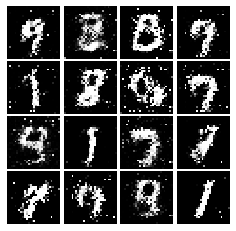

Epoch: 5, Iter: 2440, D: 0.2013, G:0.1956


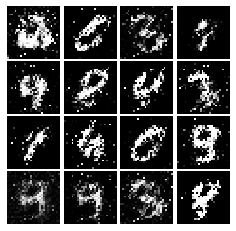

Epoch: 5, Iter: 2460, D: 0.2224, G:0.2053


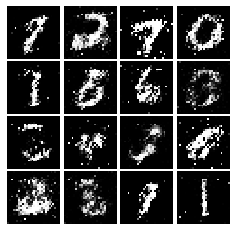

Epoch: 5, Iter: 2480, D: 0.23, G:0.1764


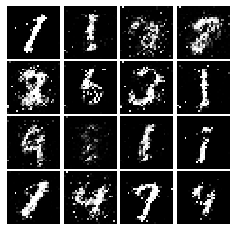

Epoch: 5, Iter: 2500, D: 0.1974, G:0.2517


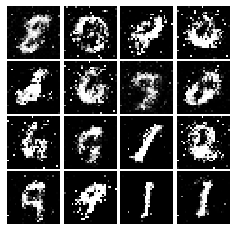

Epoch: 5, Iter: 2520, D: 0.2391, G:0.1642


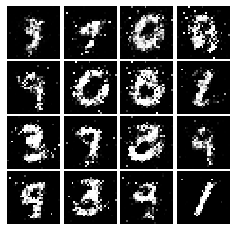

Epoch: 5, Iter: 2540, D: 0.2202, G:0.1809


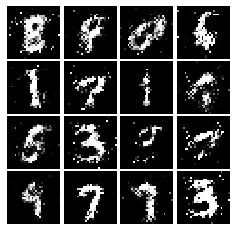

Epoch: 5, Iter: 2560, D: 0.2353, G:0.1812


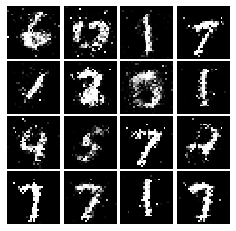

Epoch: 5, Iter: 2580, D: 0.1997, G:0.2104


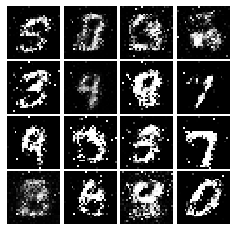

Epoch: 5, Iter: 2600, D: 0.2119, G:0.1924


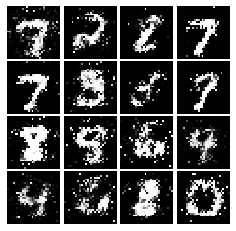

Epoch: 5, Iter: 2620, D: 0.2466, G:0.1923


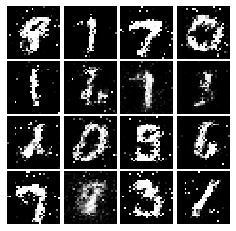

Epoch: 5, Iter: 2640, D: 0.222, G:0.2145


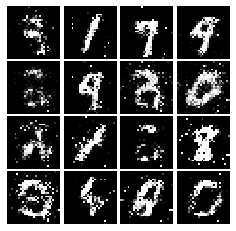

Epoch: 5, Iter: 2660, D: 0.2235, G:0.1729


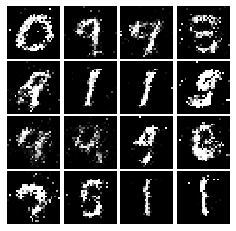

Epoch: 5, Iter: 2680, D: 0.2469, G:0.1778


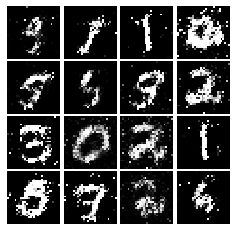

Epoch: 5, Iter: 2700, D: 0.2274, G:0.175


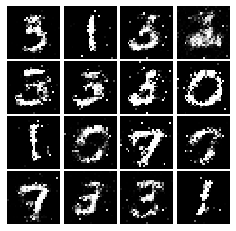

Epoch: 5, Iter: 2720, D: 0.2291, G:0.1819


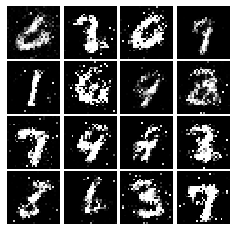

Epoch: 5, Iter: 2740, D: 0.2263, G:0.1878


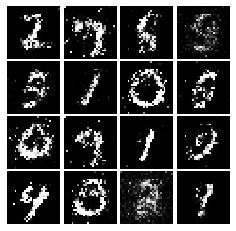

Epoch: 5, Iter: 2760, D: 0.2139, G:0.1737


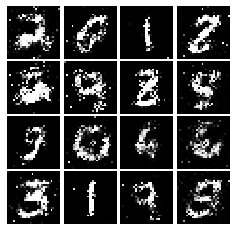

Epoch: 5, Iter: 2780, D: 0.2135, G:0.2046


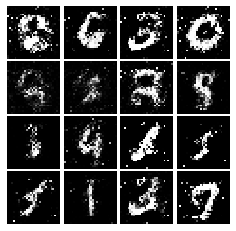

Epoch: 5, Iter: 2800, D: 0.2135, G:0.1643


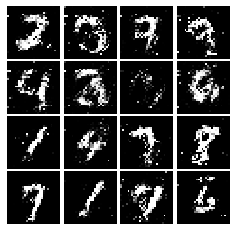

Epoch: 6, Iter: 2820, D: 0.2322, G:0.1643


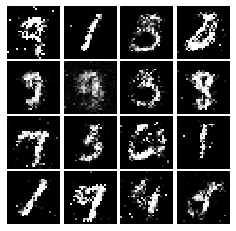

Epoch: 6, Iter: 2840, D: 0.2168, G:0.1911


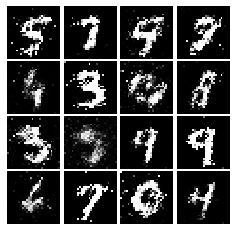

Epoch: 6, Iter: 2860, D: 0.2127, G:0.1744


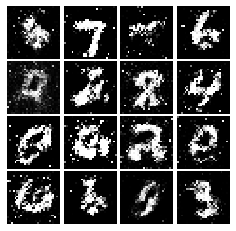

Epoch: 6, Iter: 2880, D: 0.2206, G:0.2119


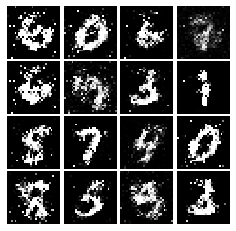

Epoch: 6, Iter: 2900, D: 0.2366, G:0.222


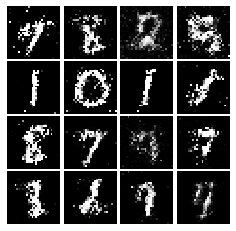

Epoch: 6, Iter: 2920, D: 0.2538, G:0.1715


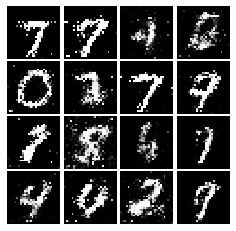

Epoch: 6, Iter: 2940, D: 0.2241, G:0.1849


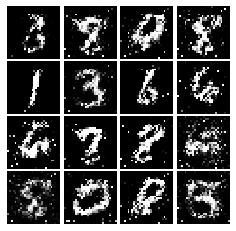

Epoch: 6, Iter: 2960, D: 0.2242, G:0.1654


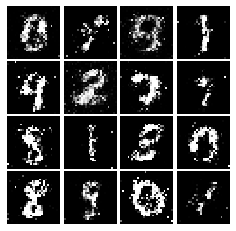

Epoch: 6, Iter: 2980, D: 0.2324, G:0.187


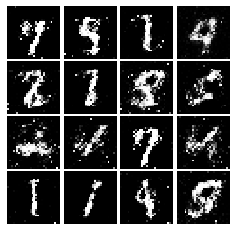

Epoch: 6, Iter: 3000, D: 0.2193, G:0.1864


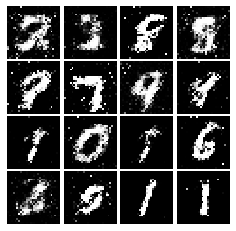

Epoch: 6, Iter: 3020, D: 0.2357, G:0.1551


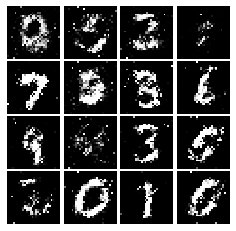

Epoch: 6, Iter: 3040, D: 0.213, G:0.199


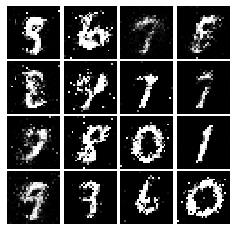

Epoch: 6, Iter: 3060, D: 0.2641, G:0.1902


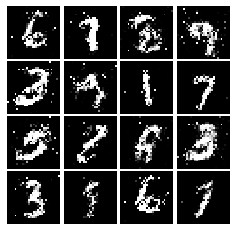

Epoch: 6, Iter: 3080, D: 0.2337, G:0.182


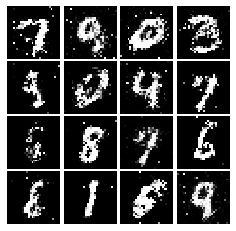

Epoch: 6, Iter: 3100, D: 0.1919, G:0.1987


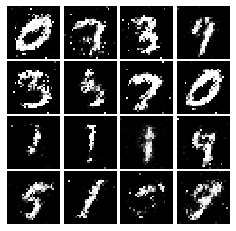

Epoch: 6, Iter: 3120, D: 0.2154, G:0.2635


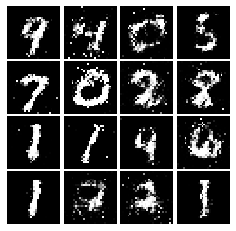

Epoch: 6, Iter: 3140, D: 0.248, G:0.1669


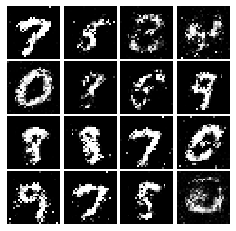

Epoch: 6, Iter: 3160, D: 0.2158, G:0.1764


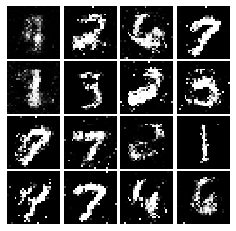

Epoch: 6, Iter: 3180, D: 0.2227, G:0.1568


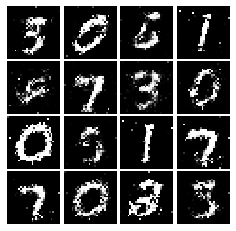

Epoch: 6, Iter: 3200, D: 0.1871, G:0.193


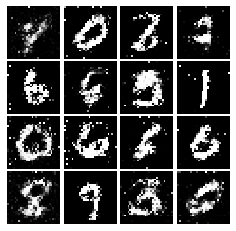

Epoch: 6, Iter: 3220, D: 0.222, G:0.1981


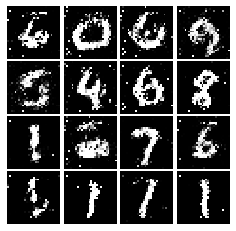

Epoch: 6, Iter: 3240, D: 0.2115, G:0.1858


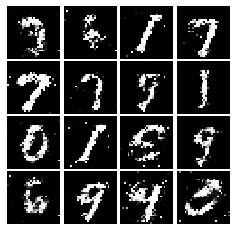

Epoch: 6, Iter: 3260, D: 0.2277, G:0.1723


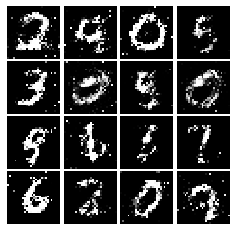

Epoch: 6, Iter: 3280, D: 0.2242, G:0.1711


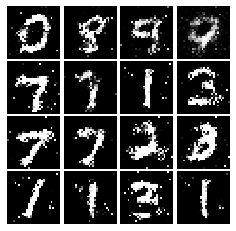

Epoch: 7, Iter: 3300, D: 0.2189, G:0.1992


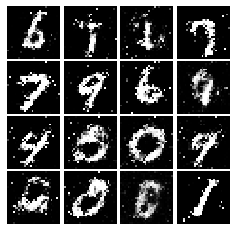

Epoch: 7, Iter: 3320, D: 0.2369, G:0.2107


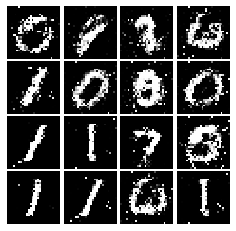

Epoch: 7, Iter: 3340, D: 0.2264, G:0.1594


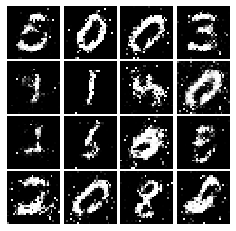

Epoch: 7, Iter: 3360, D: 0.2306, G:0.1763


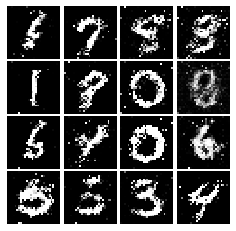

Epoch: 7, Iter: 3380, D: 0.2196, G:0.1788


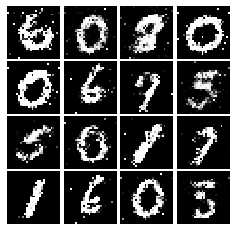

Epoch: 7, Iter: 3400, D: 0.241, G:0.1779


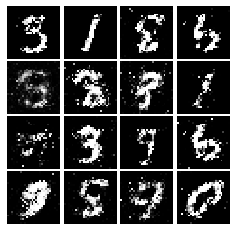

Epoch: 7, Iter: 3420, D: 0.2307, G:0.2001


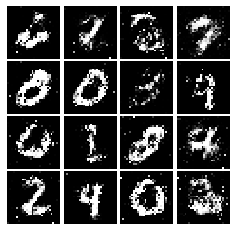

Epoch: 7, Iter: 3440, D: 0.2372, G:0.1375


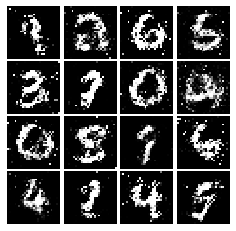

Epoch: 7, Iter: 3460, D: 0.2001, G:0.221


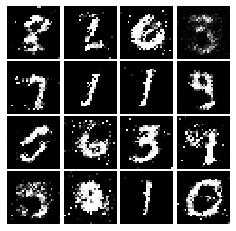

Epoch: 7, Iter: 3480, D: 0.2225, G:0.1859


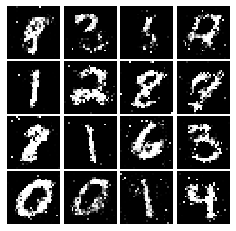

Epoch: 7, Iter: 3500, D: 0.2202, G:0.1837


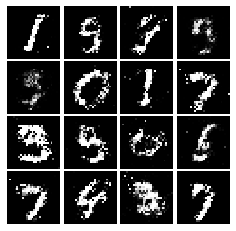

Epoch: 7, Iter: 3520, D: 0.2331, G:0.1849


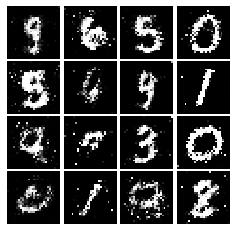

Epoch: 7, Iter: 3540, D: 0.2158, G:0.1756


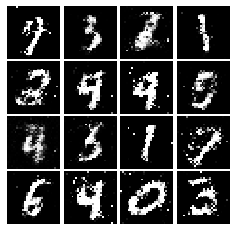

Epoch: 7, Iter: 3560, D: 0.1994, G:0.1824


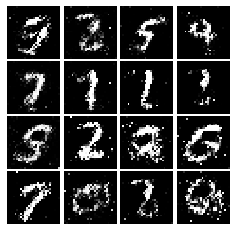

Epoch: 7, Iter: 3580, D: 0.2277, G:0.1812


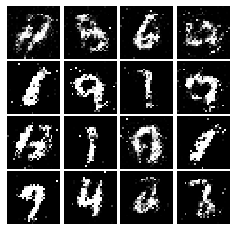

Epoch: 7, Iter: 3600, D: 0.221, G:0.1717


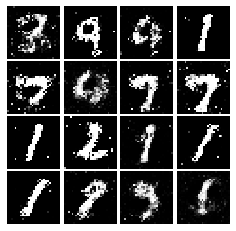

Epoch: 7, Iter: 3620, D: 0.2141, G:0.1545


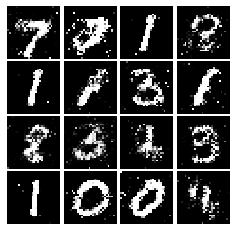

Epoch: 7, Iter: 3640, D: 0.2147, G:0.184


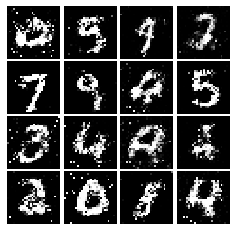

Epoch: 7, Iter: 3660, D: 0.2156, G:0.2175


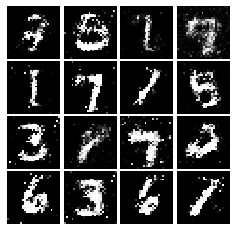

Epoch: 7, Iter: 3680, D: 0.213, G:0.2217


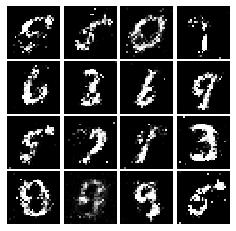

Epoch: 7, Iter: 3700, D: 0.2197, G:0.1777


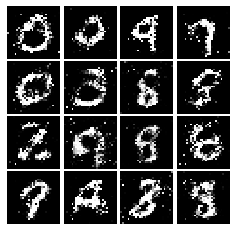

Epoch: 7, Iter: 3720, D: 0.251, G:0.1743


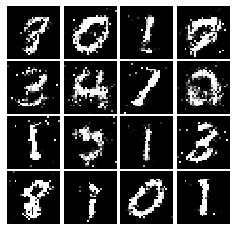

Epoch: 7, Iter: 3740, D: 0.27, G:0.1688


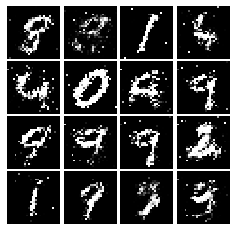

Epoch: 8, Iter: 3760, D: 0.2282, G:0.1839


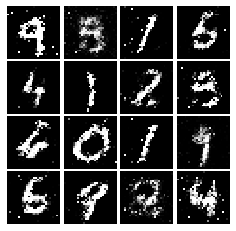

Epoch: 8, Iter: 3780, D: 0.2183, G:0.1383


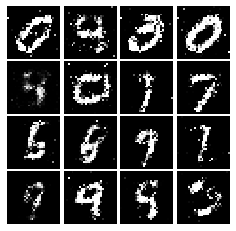

Epoch: 8, Iter: 3800, D: 0.2189, G:0.1655


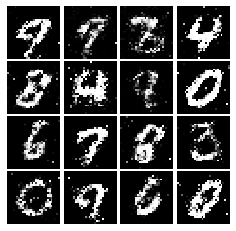

Epoch: 8, Iter: 3820, D: 0.2386, G:0.1639


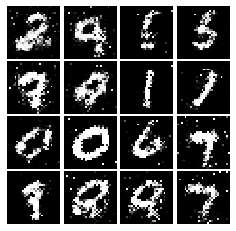

Epoch: 8, Iter: 3840, D: 0.2055, G:0.1749


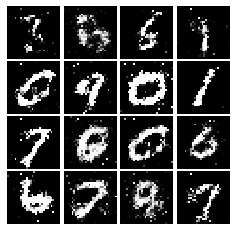

Epoch: 8, Iter: 3860, D: 0.2258, G:0.1857


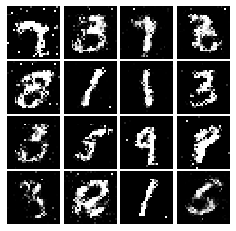

Epoch: 8, Iter: 3880, D: 0.2326, G:0.1567


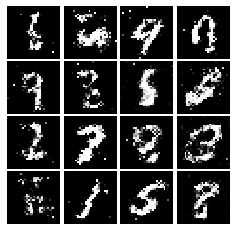

Epoch: 8, Iter: 3900, D: 0.2389, G:0.1592


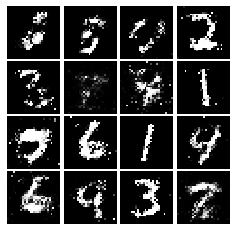

Epoch: 8, Iter: 3920, D: 0.1994, G:0.1826


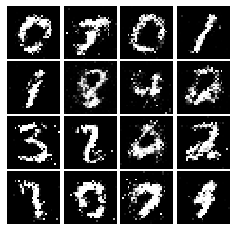

Epoch: 8, Iter: 3940, D: 0.2046, G:0.1828


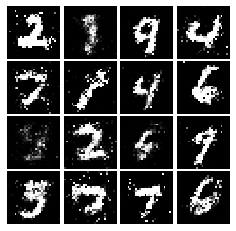

Epoch: 8, Iter: 3960, D: 0.2248, G:0.1727


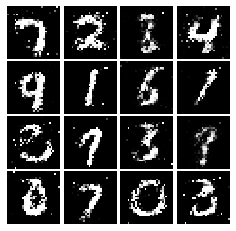

Epoch: 8, Iter: 3980, D: 0.21, G:0.177


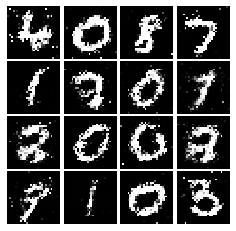

Epoch: 8, Iter: 4000, D: 0.2525, G:0.1763


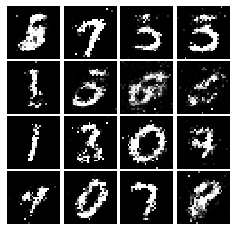

Epoch: 8, Iter: 4020, D: 0.2215, G:0.1688


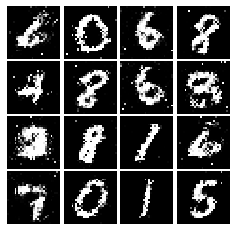

Epoch: 8, Iter: 4040, D: 0.2027, G:0.1803


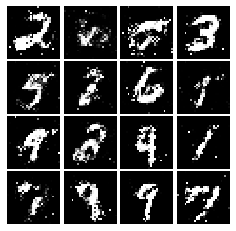

Epoch: 8, Iter: 4060, D: 0.2145, G:0.1666


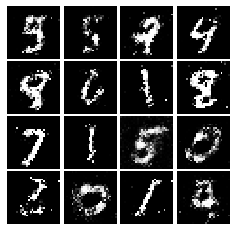

Epoch: 8, Iter: 4080, D: 0.2435, G:0.1697


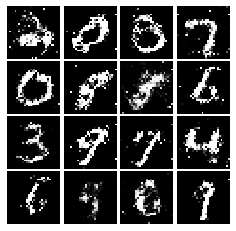

Epoch: 8, Iter: 4100, D: 0.2289, G:0.1501


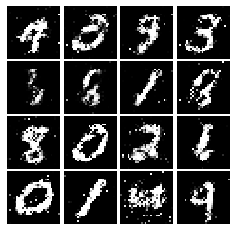

Epoch: 8, Iter: 4120, D: 0.205, G:0.1684


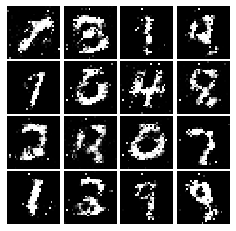

Epoch: 8, Iter: 4140, D: 0.2357, G:0.1931


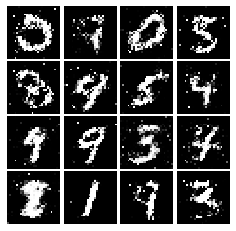

Epoch: 8, Iter: 4160, D: 0.2252, G:0.2093


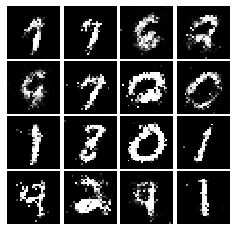

Epoch: 8, Iter: 4180, D: 0.247, G:0.1602


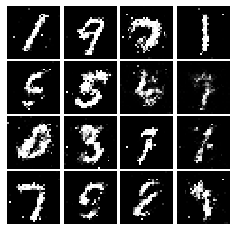

Epoch: 8, Iter: 4200, D: 0.2126, G:0.1762


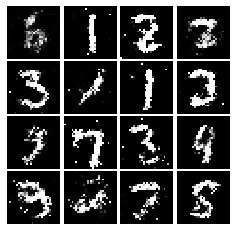

Epoch: 8, Iter: 4220, D: 0.2312, G:0.1578


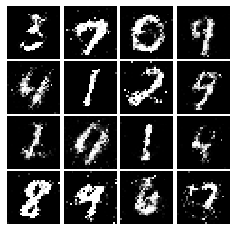

Epoch: 9, Iter: 4240, D: 0.2344, G:0.1758


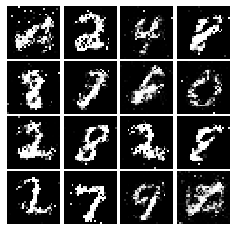

Epoch: 9, Iter: 4260, D: 0.2279, G:0.1528


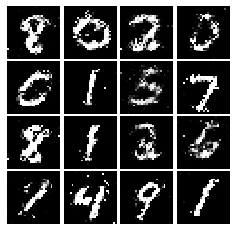

Epoch: 9, Iter: 4280, D: 0.2445, G:0.1534


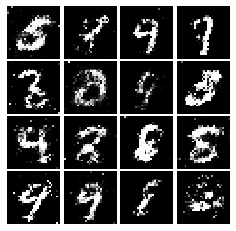

Epoch: 9, Iter: 4300, D: 0.2491, G:0.1751


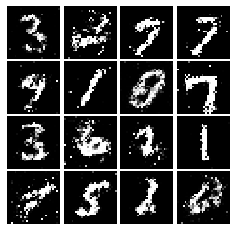

Epoch: 9, Iter: 4320, D: 0.2201, G:0.1677


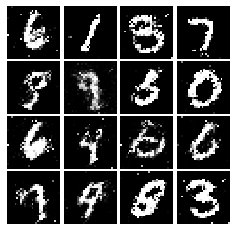

Epoch: 9, Iter: 4340, D: 0.2541, G:0.1442


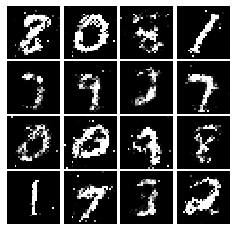

Epoch: 9, Iter: 4360, D: 0.2291, G:0.1441


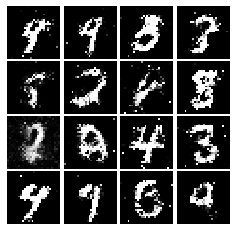

Epoch: 9, Iter: 4380, D: 0.2477, G:0.1635


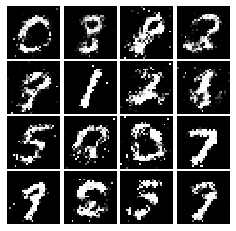

Epoch: 9, Iter: 4400, D: 0.2205, G:0.1959


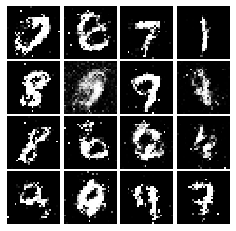

Epoch: 9, Iter: 4420, D: 0.2127, G:0.1612


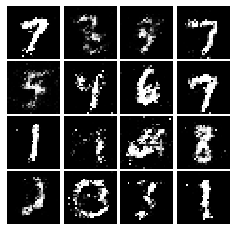

Epoch: 9, Iter: 4440, D: 0.2412, G:0.182


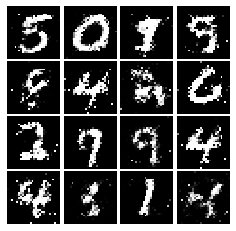

Epoch: 9, Iter: 4460, D: 0.2294, G:0.1755


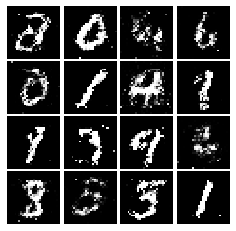

Epoch: 9, Iter: 4480, D: 0.2383, G:0.1548


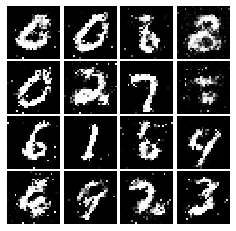

Epoch: 9, Iter: 4500, D: 0.248, G:0.1524


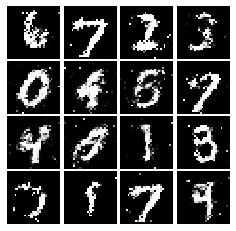

Epoch: 9, Iter: 4520, D: 0.2438, G:0.1786


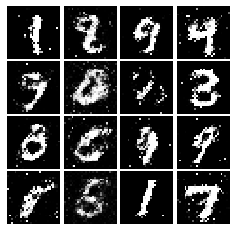

Epoch: 9, Iter: 4540, D: 0.2379, G:0.159


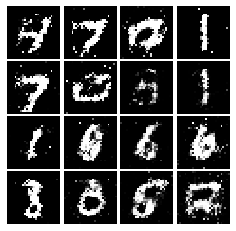

Epoch: 9, Iter: 4560, D: 0.2221, G:0.1749


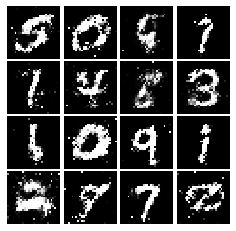

Epoch: 9, Iter: 4580, D: 0.2342, G:0.1909


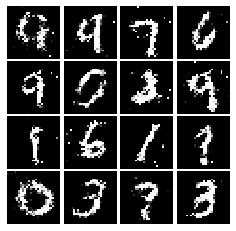

Epoch: 9, Iter: 4600, D: 0.2235, G:0.1558


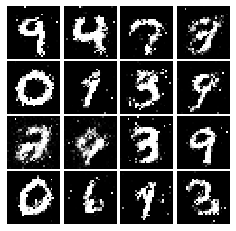

Epoch: 9, Iter: 4620, D: 0.2222, G:0.146


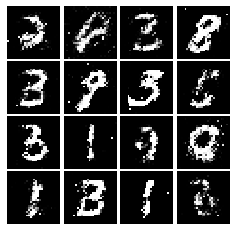

Epoch: 9, Iter: 4640, D: 0.2269, G:0.1759


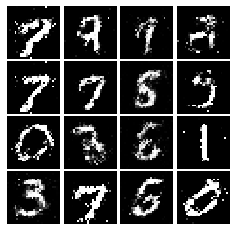

Epoch: 9, Iter: 4660, D: 0.2211, G:0.1854


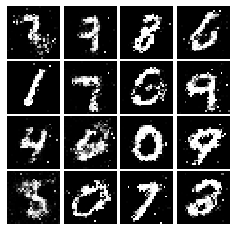

Epoch: 9, Iter: 4680, D: 0.2249, G:0.1814


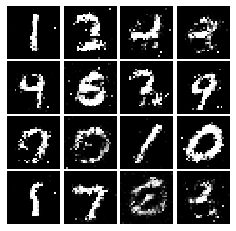

Final images


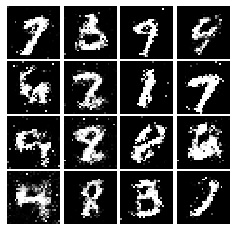

In [117]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [160]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Reshape((28,28,1), input_shape=(784,)),
        tf.keras.layers.Conv2D(32,(5,5)),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPooling2D((2,2),(2,2)),
        tf.keras.layers.Conv2D(64,(5,5)),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPooling2D((2,2),(2,2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1)
    ])

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [161]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(1024,activation=tf.nn.relu, input_dim = noise_dim),
    tf.keras.layers.BatchNormalization(trainable=True),
    tf.keras.layers.Dense(7*7*128,activation=tf.nn.relu),
    tf.keras.layers.BatchNormalization(trainable=True),
    tf.keras.layers.Reshape([7,7,128]),
    tf.keras.layers.Conv2DTranspose(64,(4,4),(2,2),activation=tf.nn.relu,padding='SAME'),
    tf.keras.layers.BatchNormalization(trainable=True),
    tf.keras.layers.Conv2DTranspose(1,(4,4),(2,2),activation=tf.nn.tanh,padding='SAME')
    ])
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.404, G:0.6561


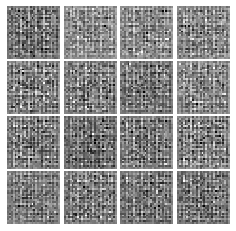

Epoch: 0, Iter: 20, D: 0.2307, G:1.871


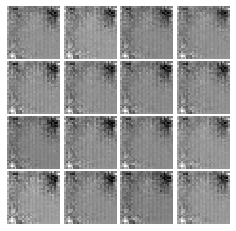

Epoch: 0, Iter: 40, D: 0.003843, G:5.683


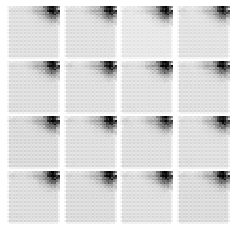

Epoch: 0, Iter: 60, D: 0.001407, G:6.634


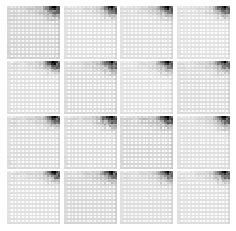

Epoch: 0, Iter: 80, D: 0.0007275, G:7.298


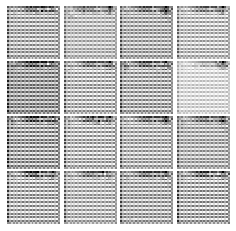

Epoch: 0, Iter: 100, D: 0.0004051, G:7.846


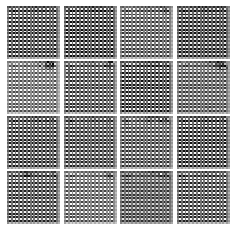

Epoch: 0, Iter: 120, D: 0.0002732, G:8.242


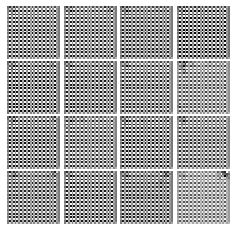

Epoch: 0, Iter: 140, D: 0.0001931, G:8.573


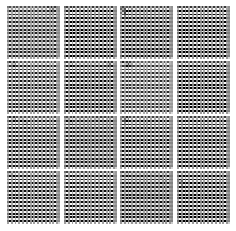

Epoch: 0, Iter: 160, D: 0.0001464, G:8.855


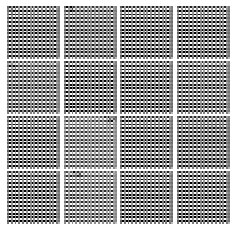

Epoch: 0, Iter: 180, D: 0.000114, G:9.109


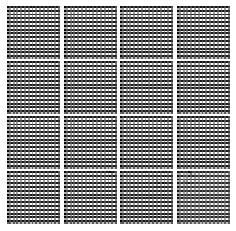

Epoch: 0, Iter: 200, D: 9.487e-05, G:9.272


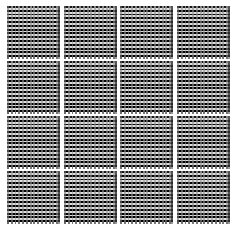

Epoch: 0, Iter: 220, D: 7.605e-05, G:9.499


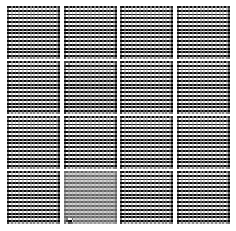

Epoch: 0, Iter: 240, D: 6.263e-05, G:9.698


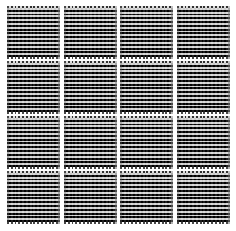

Epoch: 0, Iter: 260, D: 5.248e-05, G:9.875


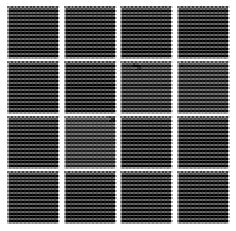

Epoch: 0, Iter: 280, D: 4.495e-05, G:10.04


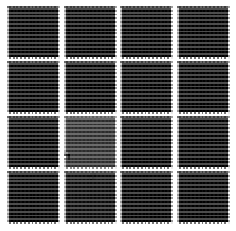

Epoch: 0, Iter: 300, D: 3.837e-05, G:10.18


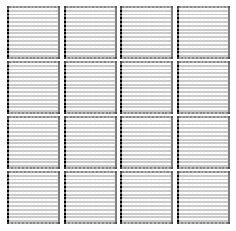

Epoch: 0, Iter: 320, D: 3.35e-05, G:10.32


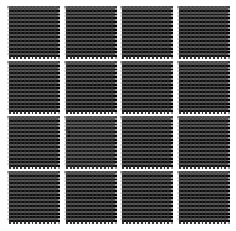

Epoch: 0, Iter: 340, D: 3.123e-05, G:10.38


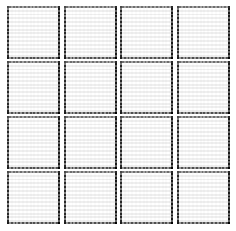

Epoch: 0, Iter: 360, D: 2.748e-05, G:10.52


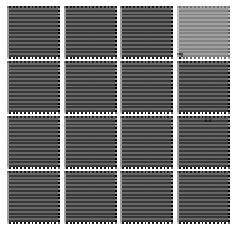

Epoch: 0, Iter: 380, D: 2.448e-05, G:10.63


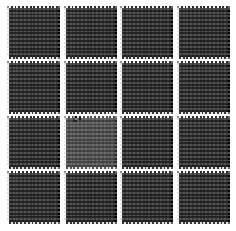

Epoch: 0, Iter: 400, D: 2.215e-05, G:10.74


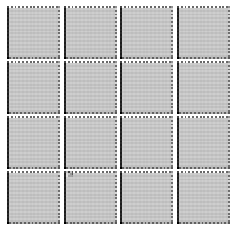

Epoch: 0, Iter: 420, D: 1.993e-05, G:10.85


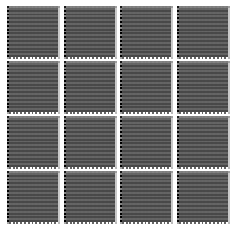

Epoch: 0, Iter: 440, D: 1.845e-05, G:10.95


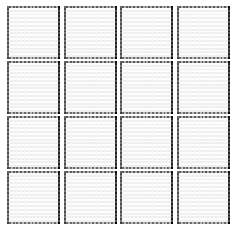

Epoch: 0, Iter: 460, D: 1.622e-05, G:11.04


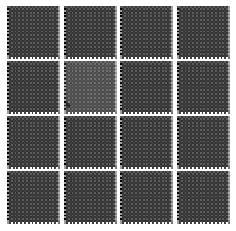

Epoch: 1, Iter: 480, D: 1.492e-05, G:11.13


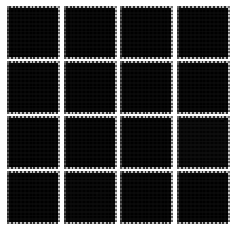

Epoch: 1, Iter: 500, D: 1.366e-05, G:11.22


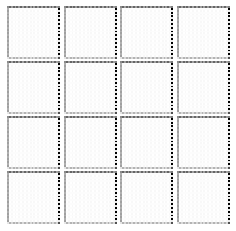

Epoch: 1, Iter: 520, D: 2.019e-05, G:10.82


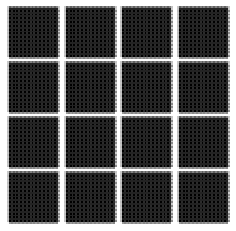

Epoch: 1, Iter: 540, D: 0.262, G:1.592


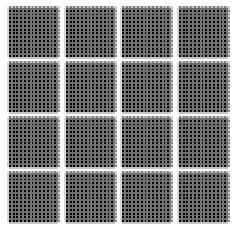

Epoch: 1, Iter: 560, D: 0.005793, G:5.237


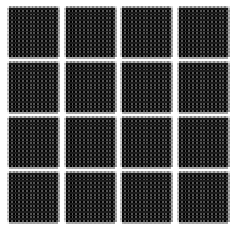

Epoch: 1, Iter: 580, D: 0.001866, G:6.324


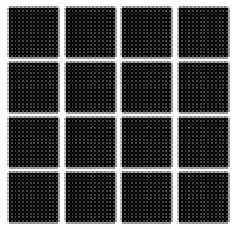

Epoch: 1, Iter: 600, D: 0.0009805, G:6.954


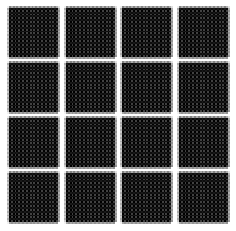

Epoch: 1, Iter: 620, D: 0.000624, G:7.399


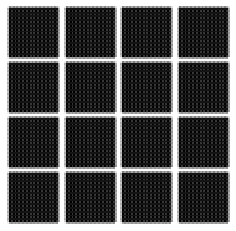

Epoch: 1, Iter: 640, D: 0.0004407, G:7.743


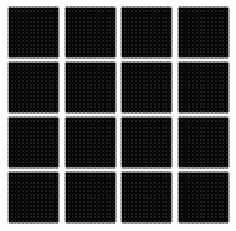

Epoch: 1, Iter: 660, D: 0.0003304, G:8.029


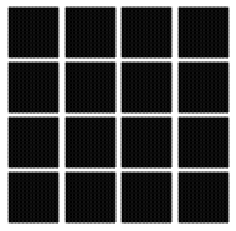

Epoch: 1, Iter: 680, D: 0.0002589, G:8.271


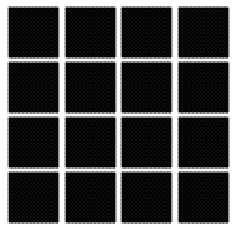

Epoch: 1, Iter: 700, D: 0.0002092, G:8.482


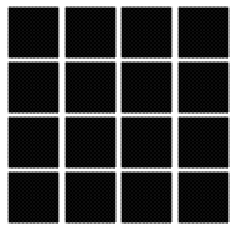

Epoch: 1, Iter: 720, D: 0.0001732, G:8.67


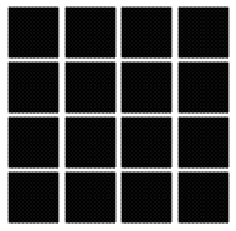

Epoch: 1, Iter: 740, D: 0.0001462, G:8.839


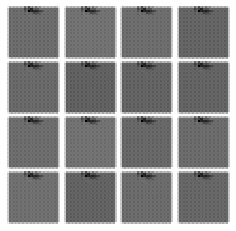

Epoch: 1, Iter: 760, D: 0.0001256, G:8.99


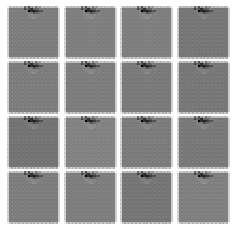

Epoch: 1, Iter: 780, D: 0.0001088, G:9.133


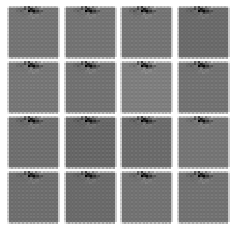

Epoch: 1, Iter: 800, D: 9.559e-05, G:9.262


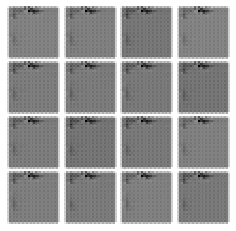

Epoch: 1, Iter: 820, D: 8.534e-05, G:9.375


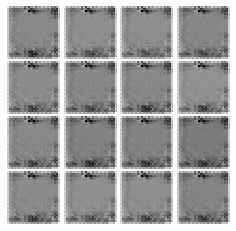

Epoch: 1, Iter: 840, D: 7.632e-05, G:9.486


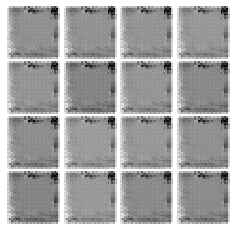

Epoch: 1, Iter: 860, D: 1.415e-06, G:13.48


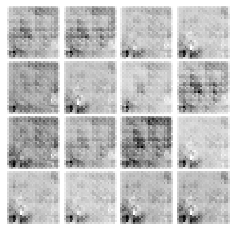

Epoch: 1, Iter: 880, D: 0.3488, G:2.341


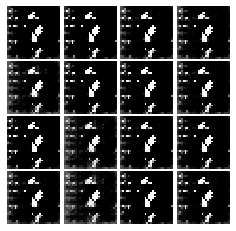

Epoch: 1, Iter: 900, D: 0.6184, G:1.738


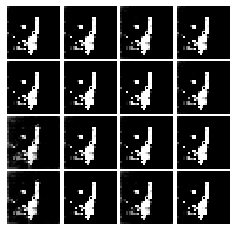

Epoch: 1, Iter: 920, D: 0.01524, G:5.955


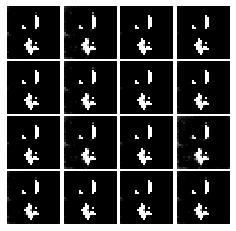

Epoch: 2, Iter: 940, D: 0.4967, G:2.369


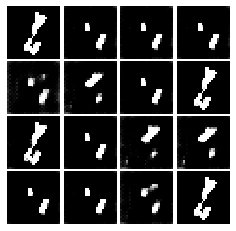

Epoch: 2, Iter: 960, D: 0.6915, G:2.703


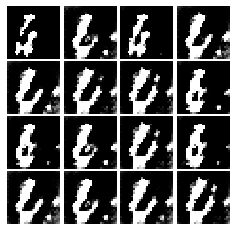

Epoch: 2, Iter: 980, D: 1.129, G:1.844


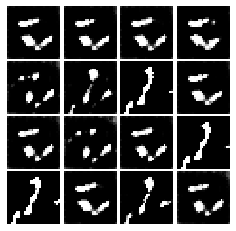

Epoch: 2, Iter: 1000, D: 1.008, G:3.903


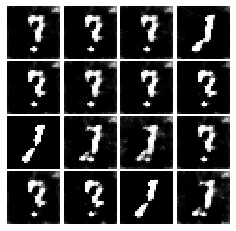

Epoch: 2, Iter: 1020, D: 0.8521, G:2.042


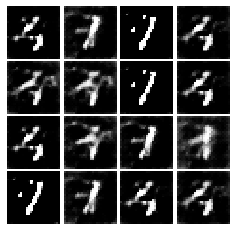

Epoch: 2, Iter: 1040, D: 1.065, G:3.111


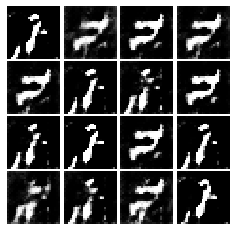

Epoch: 2, Iter: 1060, D: 0.4256, G:2.567


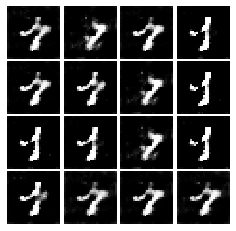

Epoch: 2, Iter: 1080, D: 0.7865, G:1.772


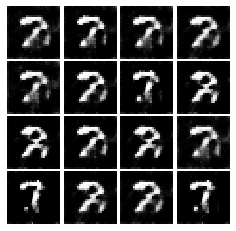

Epoch: 2, Iter: 1100, D: 0.8647, G:2.837


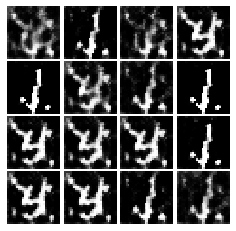

Epoch: 2, Iter: 1120, D: 0.4847, G:3.556


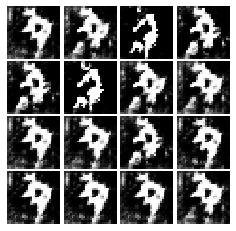

Epoch: 2, Iter: 1140, D: 0.8964, G:3.032


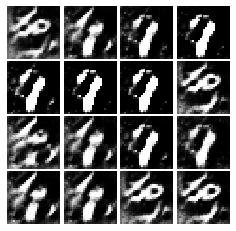

Epoch: 2, Iter: 1160, D: 1.037, G:1.915


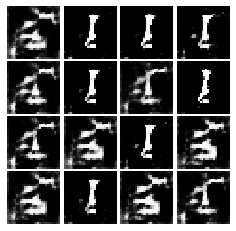

Epoch: 2, Iter: 1180, D: 1.146, G:1.502


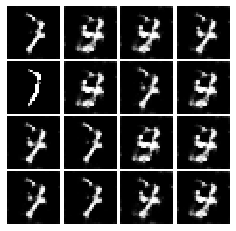

Epoch: 2, Iter: 1200, D: 0.8867, G:2.465


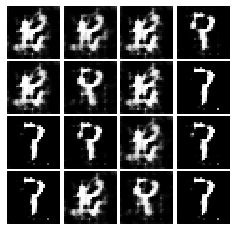

Epoch: 2, Iter: 1220, D: 0.4325, G:2.466


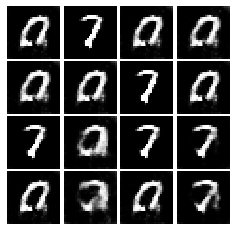

Epoch: 2, Iter: 1240, D: 0.4156, G:3.19


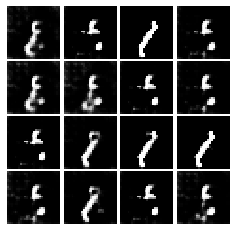

Epoch: 2, Iter: 1260, D: 0.5771, G:4.212


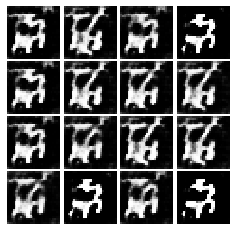

Epoch: 2, Iter: 1280, D: 0.7903, G:2.911


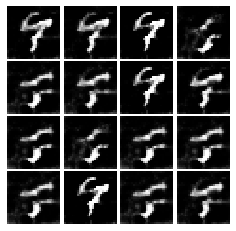

Epoch: 2, Iter: 1300, D: 0.5027, G:2.206


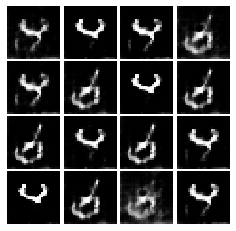

Epoch: 2, Iter: 1320, D: 0.6934, G:2.137


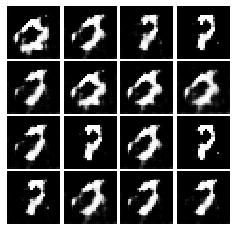

Epoch: 2, Iter: 1340, D: 0.2445, G:2.982


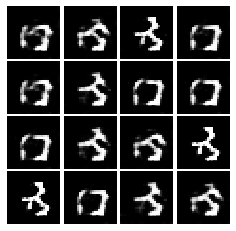

Epoch: 2, Iter: 1360, D: 0.5409, G:2.892


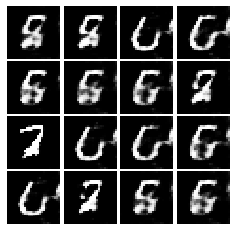

Epoch: 2, Iter: 1380, D: 0.439, G:2.282


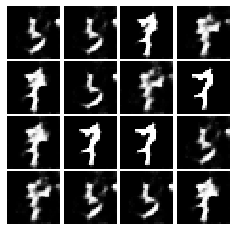

Epoch: 2, Iter: 1400, D: 0.3283, G:3.592


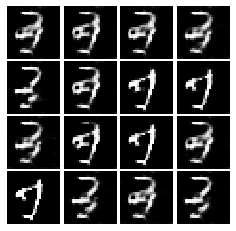

Epoch: 3, Iter: 1420, D: 0.4865, G:2.784


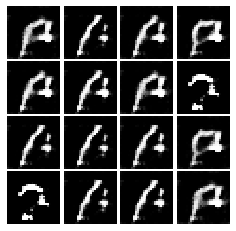

Epoch: 3, Iter: 1440, D: 0.7042, G:2.128


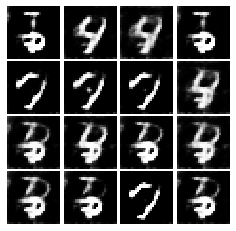

Epoch: 3, Iter: 1460, D: 0.7098, G:2.094


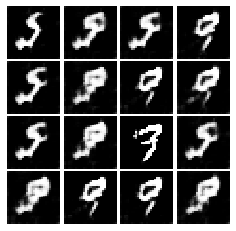

Epoch: 3, Iter: 1480, D: 0.616, G:3.08


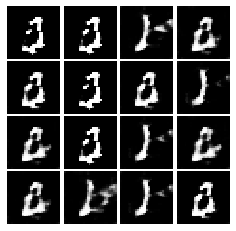

Epoch: 3, Iter: 1500, D: 1.131, G:5.696


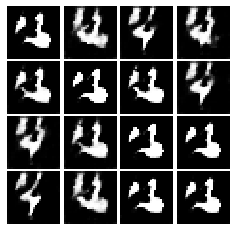

Epoch: 3, Iter: 1520, D: 0.7867, G:4.106


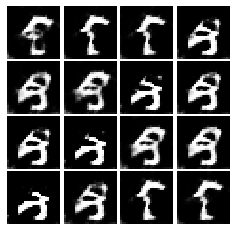

Epoch: 3, Iter: 1540, D: 1.976, G:4.834


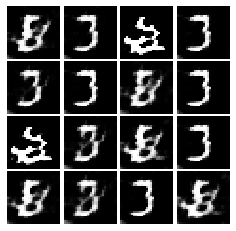

Epoch: 3, Iter: 1560, D: 0.7415, G:1.897


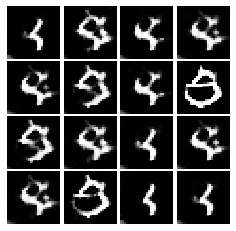

Epoch: 3, Iter: 1580, D: 1.059, G:2.796


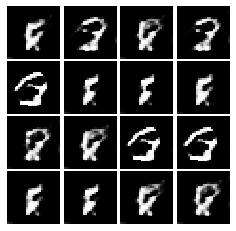

Epoch: 3, Iter: 1600, D: 0.7848, G:1.375


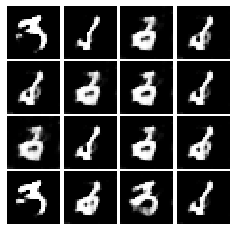

Epoch: 3, Iter: 1620, D: 0.713, G:4.29


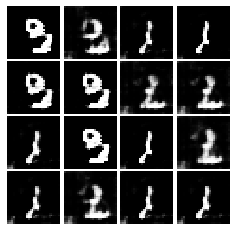

Epoch: 3, Iter: 1640, D: 1.082, G:4.621


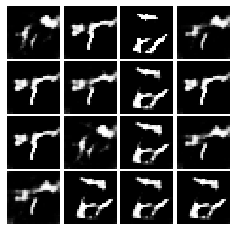

Epoch: 3, Iter: 1660, D: 0.6018, G:1.916


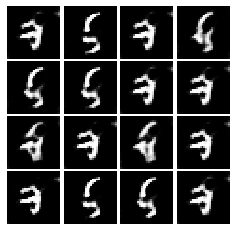

Epoch: 3, Iter: 1680, D: 0.577, G:1.556


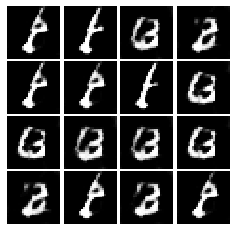

Epoch: 3, Iter: 1700, D: 0.5057, G:2.747


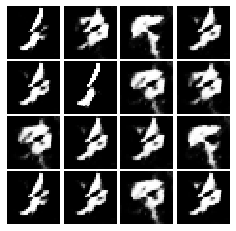

Epoch: 3, Iter: 1720, D: 0.3682, G:2.498


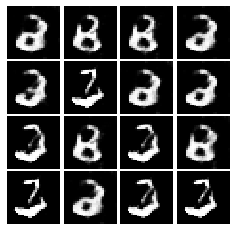

Epoch: 3, Iter: 1740, D: 0.8217, G:2.193


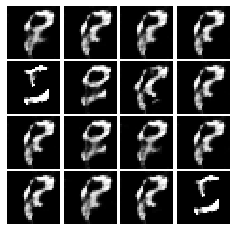

Epoch: 3, Iter: 1760, D: 0.5487, G:2.844


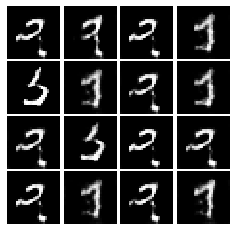

Epoch: 3, Iter: 1780, D: 0.7534, G:2.912


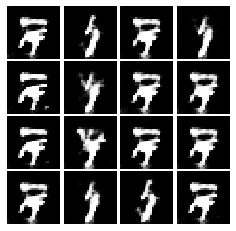

Epoch: 3, Iter: 1800, D: 0.5492, G:2.728


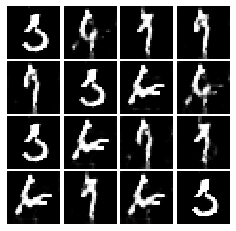

Epoch: 3, Iter: 1820, D: 0.3691, G:2.96


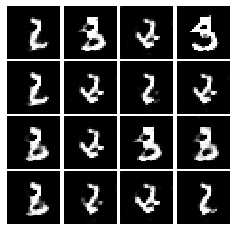

Epoch: 3, Iter: 1840, D: 0.5263, G:2.049


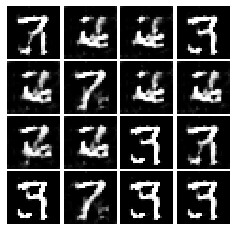

Epoch: 3, Iter: 1860, D: 0.723, G:3.244


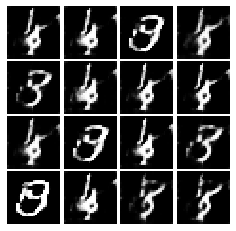

Epoch: 4, Iter: 1880, D: 0.2451, G:3.212


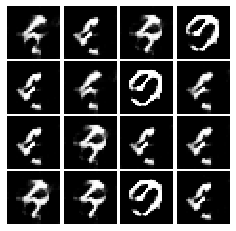

Epoch: 4, Iter: 1900, D: 0.5471, G:2.525


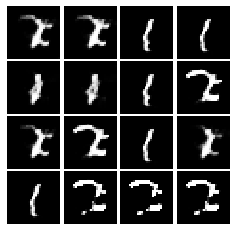

Epoch: 4, Iter: 1920, D: 0.4598, G:2.947


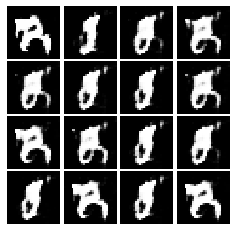

Epoch: 4, Iter: 1940, D: 0.4559, G:2.362


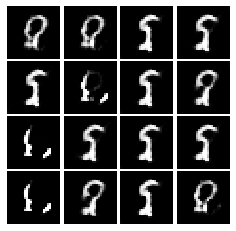

Epoch: 4, Iter: 1960, D: 0.2107, G:3.137


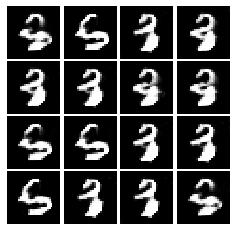

Epoch: 4, Iter: 1980, D: 0.1756, G:3.99


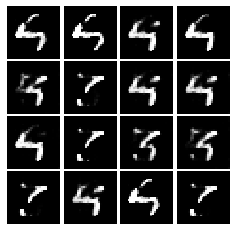

Epoch: 4, Iter: 2000, D: 1.225, G:7.479


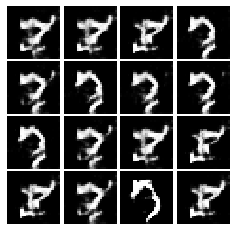

Epoch: 4, Iter: 2020, D: 0.6185, G:5.268


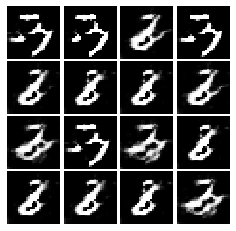

Epoch: 4, Iter: 2040, D: 0.1715, G:3.801


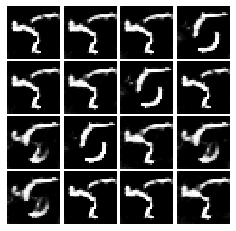

Epoch: 4, Iter: 2060, D: 0.4382, G:4.155


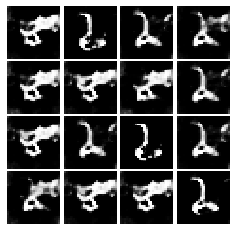

Epoch: 4, Iter: 2080, D: 1.407, G:2.567


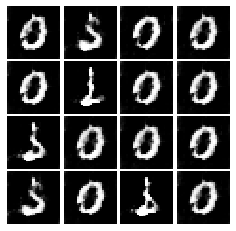

Epoch: 4, Iter: 2100, D: 0.3529, G:2.824


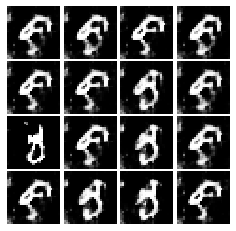

Epoch: 4, Iter: 2120, D: 0.6952, G:2.022


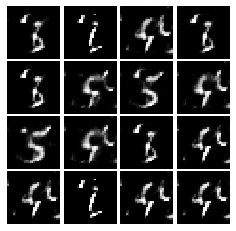

Epoch: 4, Iter: 2140, D: 0.9961, G:2.054


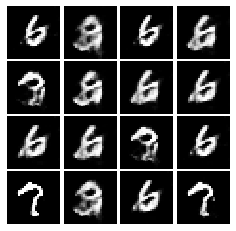

Epoch: 4, Iter: 2160, D: 0.4192, G:3.731


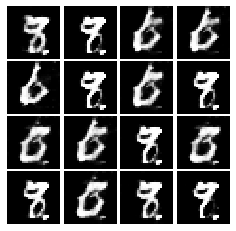

Epoch: 4, Iter: 2180, D: 0.326, G:3.05


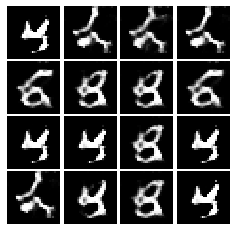

Epoch: 4, Iter: 2200, D: 0.4693, G:2.197


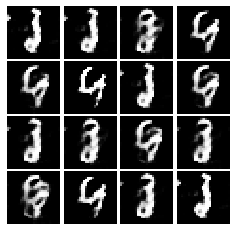

Epoch: 4, Iter: 2220, D: 0.3226, G:3.697


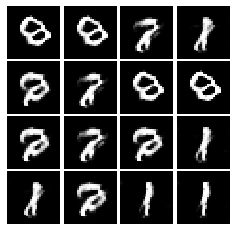

Epoch: 4, Iter: 2240, D: 1.684, G:4.249


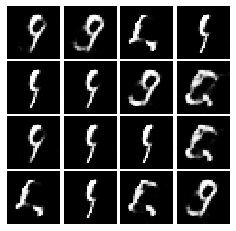

Epoch: 4, Iter: 2260, D: 0.4089, G:4.854


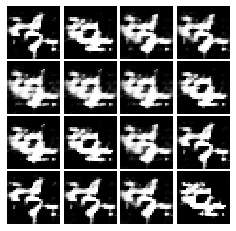

Epoch: 4, Iter: 2280, D: 0.5529, G:5.332


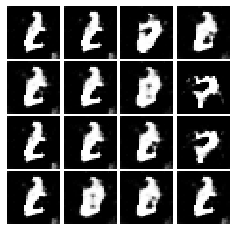

Epoch: 4, Iter: 2300, D: 0.428, G:2.089


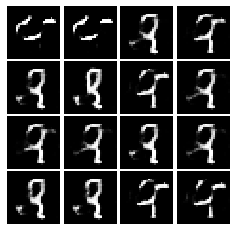

Epoch: 4, Iter: 2320, D: 0.3706, G:2.967


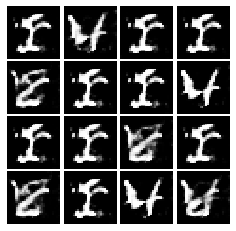

Epoch: 4, Iter: 2340, D: 0.2825, G:2.077


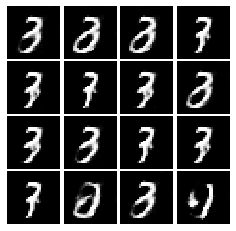

Final images


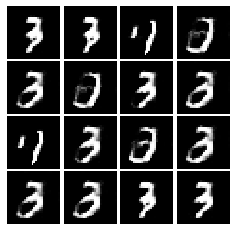

In [162]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |       |       |       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |       |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
